# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [77]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [9]:
len(reviews)

25000

In [10]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [11]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [12]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [37]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [38]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [39]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
positive_counts.clear()
negative_counts.clear()
total_counts.clear()

for sentence, label in zip(reviews, labels):
    for word in sentence.split(' '):
        if label == 'POSITIVE':
            positive_counts[word] += 1
            total_counts[word] += 1
        else:
            negative_counts[word] +=1
            total_counts[word] += 1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [40]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [41]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

In [42]:
i = 0
for term, cnt in negative_counts.most_common():
    i = i +1
    print(term,cnt)

 561462
. 167538
the 163389
a 79321
and 74385
of 69009
to 68974
br 52637
is 50083
it 48327
i 46880
in 43753
this 40920
that 37615
s 31546
was 26291
movie 24965
for 21927
but 21781
with 20878
as 20625
t 20361
film 19218
you 17549
on 17192
not 16354
have 15144
are 14623
be 14541
he 13856
one 13134
they 13011
at 12279
his 12147
all 12036
so 11463
like 11238
there 10775
just 10619
by 10549
or 10272
an 10266
who 9969
from 9731
if 9518
about 9061
out 8979
what 8422
some 8306
no 8143
her 7947
even 7687
can 7653
has 7604
good 7423
bad 7401
would 7036
up 6970
only 6781
more 6730
when 6726
she 6444
really 6262
time 6209
had 6142
my 6015
were 6001
which 5780
very 5764
me 5606
see 5452
don 5336
we 5328
their 5278
do 5236
story 5208
than 5183
been 5100
much 5078
get 5037
because 4966
people 4806
then 4761
make 4722
how 4688
could 4686
any 4658
into 4567
made 4541
first 4306
other 4305
well 4254
too 4174
them 4165
plot 4154
movies 4080
acting 4056
will 3993
way 3989
most 3919
him 3858
after 3838
its

floor 156
edited 156
captain 156
support 156
minor 156
priest 156
artistic 155
fill 155
roll 155
pop 155
junk 155
instance 155
station 155
witch 155
cross 154
adventure 154
stone 154
treated 154
summer 154
sweet 154
asked 154
moon 154
asian 154
surprisingly 154
jerry 153
critics 153
reminded 153
assume 153
master 153
context 153
magic 153
creative 153
russian 153
twenty 152
fights 152
arts 152
likable 152
murdered 152
par 152
according 152
seagal 152
boat 151
bright 151
step 151
devil 151
incredible 150
continuity 150
lake 150
faith 150
cash 150
system 150
mid 149
substance 149
suck 149
reviewers 149
trust 149
bank 149
loves 149
compare 149
williams 149
genius 149
lies 149
tim 149
teenage 148
puts 148
born 148
responsible 148
charm 148
smith 148
gotten 148
extra 147
walked 147
horse 147
color 147
loose 147
provide 147
introduced 147
lesbian 147
perfectly 147
suspect 147
heroine 147
sean 147
sequels 146
dreams 146
dressed 146
stands 146
seven 146
gags 146
nick 146
proves 145
addition 14

hood 96
genuine 96
genuinely 96
gordon 96
jail 96
mexican 96
tiny 96
everywhere 96
brown 96
voices 96
recall 96
flash 96
politics 96
gadget 96
properly 95
lying 95
washington 95
drinking 95
initial 95
morgan 95
interview 95
lifetime 95
unbelievably 95
buying 95
prior 95
drink 95
service 95
hoped 95
guilty 95
lisa 95
millions 95
keeping 95
goofy 95
comical 95
howard 94
haunted 94
occasional 94
bollywood 94
unintentional 94
gangster 94
hunt 94
regarding 94
previously 94
highlight 94
dealing 94
generous 94
gag 94
pie 94
theatrical 93
bag 93
offered 93
flight 93
bible 93
minds 93
spoil 93
dracula 93
matt 93
crowd 93
burton 93
purely 93
escapes 93
changing 93
naive 93
lovers 93
metal 93
fulci 93
featured 93
maker 93
account 93
kim 93
wilson 92
toy 92
doo 92
rambo 92
regret 92
visually 92
delivery 92
seat 92
levels 92
clips 92
weapons 92
holds 92
wayne 92
suffer 92
ignore 92
network 92
terror 92
ad 92
mirror 92
danny 92
lugosi 92
trapped 91
heavily 91
scripts 91
north 91
breasts 91
emotions 

argue 59
faster 59
tour 59
factory 59
controversial 59
cynical 59
endure 59
outrageous 59
stereotype 59
altogether 59
eva 59
tales 59
nope 59
selfish 59
centered 59
psychic 59
pretending 59
spielberg 59
feed 59
library 59
cure 59
tasteless 59
grandmother 59
importantly 59
lloyd 59
filth 59
hunting 59
losers 59
frustrated 59
naschy 59
sally 58
worker 58
sir 58
walker 58
subjected 58
rocks 58
harder 58
asylum 58
greater 58
stretched 58
preposterous 58
bathroom 58
destruction 58
evident 58
kicking 58
spell 58
painting 58
menacing 58
orders 58
buddies 58
clothing 58
balls 58
et 58
crisis 58
murray 58
melodramatic 58
tradition 58
samurai 58
surrounding 58
firstly 58
benefit 58
acid 58
motivations 58
cia 58
shortly 58
disease 58
spiritual 58
mouse 58
walter 58
dating 58
spy 58
mate 58
wwii 58
dorothy 58
chain 58
ignored 58
ireland 58
sutherland 58
wendy 58
stays 57
simplistic 57
thumbs 57
cake 57
cliff 57
searching 57
pulp 57
determined 57
push 57
offering 57
arrested 57
spoiled 57
rocket 57

duration 41
tear 41
replace 41
cliches 41
hilariously 41
beverly 41
feeding 41
daughters 41
youtube 41
von 41
conscious 41
quinn 41
stunned 41
immature 41
comedians 41
conservative 41
manhattan 41
colorful 41
barrymore 41
electric 41
nemesis 41
harm 41
stairs 41
vast 41
dates 41
construction 41
cuba 41
represented 41
communist 41
importance 41
russia 41
hamilton 41
ashley 41
unattractive 41
abortion 41
progress 41
advertised 41
bull 41
bettie 41
clay 41
messing 41
zizek 41
sholay 41
ocean 40
unsympathetic 40
bath 40
judy 40
dafoe 40
traffic 40
rival 40
realizing 40
catchy 40
slick 40
enormous 40
deranged 40
wakes 40
health 40
wrap 40
everyday 40
insults 40
jackie 40
option 40
bold 40
filling 40
nauseating 40
wrapped 40
polly 40
milk 40
snuff 40
steer 40
closed 40
tip 40
dump 40
strangers 40
cartoonish 40
package 40
rank 40
tech 40
receiving 40
bombs 40
consist 40
altered 40
corn 40
pushing 40
previews 40
spree 40
grainy 40
jazz 40
computers 40
hokey 40
rehash 40
primary 40
revolutionar

ceremony 30
gasp 30
platform 30
poignant 30
slim 30
explode 30
da 30
unclear 30
grounds 30
cleaning 30
boris 30
comfortable 30
marlon 30
mockery 30
distracted 30
corleone 30
expose 30
reviewed 30
invested 30
butch 30
furniture 30
unanswered 30
pale 30
stanwyck 30
bennett 30
cannon 30
users 30
establishing 30
boobs 30
occasions 30
waves 30
smiles 30
flowers 30
chew 30
significance 30
margaret 30
hazzard 30
resolved 30
chewing 30
refers 30
sins 30
convenient 30
fuzzy 30
brutality 30
sand 30
conscience 30
launch 30
leon 30
addict 30
jude 30
definite 30
jagger 30
toronto 30
complexity 30
numbingly 30
insist 30
manos 30
banter 30
undeniably 30
highest 30
frozen 30
jarring 30
duvall 30
mccarthy 30
royal 30
padded 30
phoenix 30
ralph 30
jar 30
rendition 30
household 30
mutated 30
ordered 30
surgeon 30
grass 30
penis 30
circus 30
jess 30
ignores 30
helpless 30
quasi 30
symbolic 30
kathy 30
mothers 30
reliable 30
sweat 30
wheel 30
irwin 30
beg 30
indifferent 30
monstrosity 30
lurking 30
additio

pizza 24
overweight 24
repressed 24
meredith 24
hats 24
puerile 24
scriptwriter 24
bastard 24
unfold 24
ax 24
lucio 24
protest 24
slaughtered 24
records 24
hubby 24
apocalyptic 24
robotic 24
natalie 24
hispanic 24
wisely 24
daphne 24
viewpoint 24
delight 24
untrue 24
employee 24
priests 24
masquerading 24
themed 24
interestingly 24
bars 24
colleagues 24
nearest 24
implied 24
tuned 24
triple 24
keyboard 24
lennon 24
captures 24
dash 24
lush 24
rural 24
recognition 24
woeful 24
behaving 24
immortal 24
joanna 24
acknowledge 24
destructive 24
sophomoric 24
boots 24
watered 24
variation 24
tools 24
chills 24
abominable 24
noticeable 24
eyeballs 24
inhabited 24
nicole 24
catastrophe 24
animator 24
plants 24
bogdanovich 24
networks 24
pornography 24
shah 24
weary 24
underwater 24
blamed 24
troubles 24
buys 24
strongest 24
boasts 24
growth 24
disregard 24
nada 24
ludicrously 24
fundamental 24
bishop 24
tourist 24
borders 24
oblivious 24
travis 24
distract 24
sunk 24
crashed 24
signal 24
decapi

mcgovern 20
yikes 20
ideals 20
proverbial 20
rosemary 20
fencing 20
difficulties 20
halt 20
budgeted 20
aussie 20
kris 20
phase 20
bias 20
gig 20
deniro 20
jackass 20
strapped 20
palance 20
agreeing 20
rub 20
accompanying 20
loathing 20
soooo 20
capsule 20
careless 20
towers 20
dorm 20
genitals 20
jodie 20
gypsy 20
scarlet 20
textbook 20
dusty 20
pm 20
iconic 20
jew 20
herman 20
cahill 20
uncanny 20
dressler 20
anita 20
circa 20
ketchup 20
cleverly 20
mandy 20
dinocroc 20
eggs 20
chvez 20
register 20
armor 20
orwell 20
fitz 20
psychologist 20
digress 20
bloodbath 20
romano 20
chen 20
incubus 20
sookie 20
maclaine 20
fallon 20
floors 20
coffy 20
kathleen 19
predecessors 19
lethargic 19
helicopters 19
chock 19
reminding 19
rosario 19
turmoil 19
singh 19
studied 19
superpowers 19
pimp 19
grindhouse 19
wrists 19
denouement 19
puzzled 19
deed 19
blanks 19
tighter 19
tracey 19
plagued 19
officially 19
ranch 19
festivals 19
approaches 19
wheels 19
labeled 19
gangs 19
drivers 19
parked 19
swis

denominator 16
bratty 16
wonderland 16
mitch 16
walmart 16
socialist 16
matching 16
truths 16
consumed 16
cannibalism 16
examined 16
researched 16
rosie 16
sensibilities 16
vibrant 16
cinemax 16
bursts 16
cowardly 16
pine 16
sans 16
output 16
environmental 16
operations 16
towns 16
gibson 16
equals 16
ive 16
thrust 16
circumstance 16
pulse 16
bey 16
lawn 16
revive 16
lara 16
baffling 16
transport 16
atheist 16
humiliation 16
ambiguity 16
interrupted 16
critters 16
representing 16
anchor 16
variations 16
misfits 16
searched 16
brazilian 16
rewarded 16
andie 16
mcshane 16
capabilities 16
healed 16
lsd 16
lbs 16
moby 16
federal 16
characterizations 16
laurie 16
budding 16
rom 16
spock 16
fishburne 16
nic 16
voyage 16
medication 16
proudly 16
expressing 16
passive 16
loneliness 16
hamming 16
microphone 16
stalk 16
hostages 16
permission 16
elder 16
sheet 16
scum 16
iowa 16
meth 16
jewel 16
admits 16
emergency 16
afterlife 16
nominations 16
anatomy 16
gamers 16
hodgepodge 16
execrable 16
re

bleep 14
munro 14
stacey 14
alexandre 14
distinctly 14
malicious 14
sideways 14
dwight 14
frye 14
alarming 14
chillers 14
forbes 14
fuqua 14
mug 14
sade 14
reindeer 14
collette 14
esp 14
caron 14
cleese 14
tibet 14
potts 14
wallach 14
shue 14
sayuri 14
celestine 14
matlin 14
necromancy 14
sas 14
pintilie 14
horrorfest 14
cortes 14
colagrande 14
jang 14
panzram 14
vermont 14
kothari 14
labute 14
accomplice 13
sweden 13
existential 13
dwarfs 13
ubiquitous 13
rang 13
arcs 13
irritation 13
percentage 13
rookie 13
heal 13
sample 13
shook 13
commandos 13
tens 13
groin 13
darkly 13
suite 13
diseases 13
economy 13
pokmon 13
gripe 13
outlaw 13
dual 13
premier 13
devastating 13
energetic 13
signing 13
sassy 13
exhausted 13
goodman 13
bounce 13
reels 13
fixation 13
sacred 13
execs 13
traci 13
injects 13
bb 13
versatile 13
hoods 13
sneaks 13
chapters 13
papa 13
deteriorated 13
violated 13
detention 13
covert 13
traitor 13
barnes 13
stinkers 13
swell 13
errol 13
launching 13
concentration 13
confed

carlton 12
witchery 12
casa 12
chimney 12
guided 12
ogre 12
twit 12
cleverness 12
struggled 12
sociopath 12
utilize 12
misogyny 12
brained 12
ruler 12
saturn 12
frontier 12
permanently 12
prancing 12
paz 12
vega 12
elephants 12
irons 12
jewelry 12
vows 12
marley 12
patiently 12
wrath 12
drowns 12
foreigners 12
furry 12
chant 12
neighbours 12
slides 12
vampyres 12
po 12
spectrum 12
twister 12
whoville 12
alarms 12
recapture 12
sermon 12
cukor 12
bees 12
orchid 12
donate 12
cusak 12
guttenberg 12
dreaded 12
gangsta 12
intensive 12
morse 12
investigated 12
hershey 12
rabies 12
tautou 12
prochnow 12
knotts 12
standup 12
disappointingly 12
truffaut 12
ivanna 12
cillian 12
harvest 12
gerry 12
beyonce 12
christensen 12
erica 12
trident 12
mcgraw 12
clavier 12
lemercier 12
tyrannosaurus 12
marianne 12
pinchot 12
tabu 12
dushku 12
zuniga 12
landau 12
diablo 12
aja 12
veronica 12
cryptic 11
mount 11
maureen 11
drenched 11
perpetual 11
platitudes 11
elevated 11
insistence 11
hazy 11
strain 11
rel

patched 10
misuse 10
parenting 10
cheeky 10
gleeful 10
ga 10
darren 10
savagely 10
flailing 10
grady 10
cunningham 10
gladys 10
entrails 10
foxes 10
corporations 10
unsophisticated 10
goodnight 10
behaviors 10
recalls 10
disillusioned 10
deluded 10
peasant 10
milieu 10
electrocuted 10
pipe 10
poltergeist 10
smallest 10
burstyn 10
uncovered 10
mantegna 10
attentions 10
machinations 10
harper 10
wally 10
leering 10
jeanette 10
droll 10
louder 10
blaring 10
decrepit 10
zulu 10
rudy 10
admitting 10
eels 10
candle 10
rhodes 10
fry 10
peterson 10
reuben 10
upbeat 10
prissy 10
sustained 10
haiku 10
catalog 10
divers 10
apathetic 10
lair 10
lubitsch 10
dumps 10
jacques 10
predators 10
alcatraz 10
schizophrenia 10
rewards 10
undertaker 10
bret 10
roma 10
santana 10
munching 10
jefferson 10
thanksgiving 10
glamour 10
khanna 10
moocow 10
garfield 10
anticlimactic 10
droppingly 10
baptists 10
rewriting 10
tolkien 10
adamson 10
prolific 10
milligan 10
montford 10
scalpel 10
professors 10
generals 1

knowingly 9
legitimacy 9
stalin 9
peasants 9
preface 9
sweaty 9
lyrical 9
mono 9
kilmer 9
ranged 9
fairbanks 9
masala 9
hai 9
schoolgirl 9
barcelona 9
inflicting 9
dullness 9
mastroianni 9
stewardess 9
renders 9
scenic 9
iranian 9
outings 9
unrecognizable 9
tripping 9
atlantian 9
astral 9
bluth 9
swill 9
rae 9
lemon 9
hussey 9
restricted 9
smallville 9
philippe 9
rainn 9
preserved 9
hilary 9
leonardo 9
radios 9
mencia 9
nu 9
snitch 9
skewed 9
pointy 9
measly 9
punishing 9
weddings 9
flo 9
egos 9
diluted 9
illustration 9
hain 9
coroner 9
constitutes 9
mobsters 9
undercut 9
pseudonym 9
browne 9
dumbfounded 9
hornblower 9
autopilot 9
imagines 9
duchovny 9
bosnia 9
dictatorship 9
hawke 9
anniversary 9
lillian 9
crimson 9
koreans 9
crouching 9
allende 9
shaken 9
sakura 9
gymnastics 9
tearjerker 9
throne 9
improvements 9
chilly 9
fragasso 9
beatrice 9
granddaughter 9
elves 9
apprentice 9
pedro 9
ghoulies 9
dominatrix 9
rebane 9
shin 9
dicaprio 9
lowell 9
constance 9
sy 9
bambi 9
tibetan 9
ru

floyd 7
boomer 7
bakula 7
minnesota 7
eliminating 7
wiz 7
roadkill 7
crumbling 7
forte 7
aint 7
scotty 7
freshmen 7
recalling 7
ventures 7
gracie 7
girlie 7
intrigues 7
scowls 7
afoot 7
oooh 7
pavement 7
marisa 7
regional 7
autobiographical 7
truman 7
indictment 7
gant 7
savages 7
misadventures 7
disturbs 7
clutches 7
scarlett 7
gowns 7
elisha 7
rejecting 7
unentertaining 7
purists 7
forgives 7
unwillingness 7
shawshank 7
badge 7
mercenary 7
lectures 7
singularly 7
paces 7
journalism 7
shells 7
kirstie 7
kermit 7
freezer 7
rapp 7
aghast 7
coworker 7
devoured 7
beavis 7
perabo 7
exceeded 7
breakup 7
disposing 7
draper 7
appointment 7
firefly 7
mathematics 7
tasting 7
mathematical 7
chalkboard 7
banking 7
slade 7
harrold 7
exteriors 7
yoko 7
discredited 7
export 7
rut 7
ethnicity 7
fanboys 7
bikes 7
hanna 7
enable 7
pouty 7
plotlines 7
clairvoyance 7
precedes 7
greenwood 7
dewey 7
tr 7
announce 7
ewoks 7
pessimistic 7
skywalker 7
cliffs 7
symbolizes 7
benign 7
darkened 7
creepier 7
entic

keeffe 7
carmichael 7
yorkers 7
mehbooba 7
heero 7
sarkar 7
bogayevicz 7
skid 7
norma 7
lovelace 7
sonia 7
nuyoricans 7
tarr 7
automotive 7
losey 7
bjorlin 7
pallbearer 7
robby 7
larson 7
conaway 7
matron 7
daniela 7
sabretooths 7
routh 7
maddin 7
bettina 7
curley 7
dorie 7
frollo 7
sajani 7
celia 7
hypercube 7
torrance 7
raptors 7
antitrust 7
herren 7
nayland 7
cq 7
stepin 7
hellborn 7
annik 7
formal 6
foxworth 6
disused 6
flown 6
orientated 6
stapleton 6
berman 6
howlers 6
tics 6
veil 6
cowardice 6
sleepwalk 6
schrader 6
titillate 6
parrot 6
pressures 6
migraine 6
invests 6
manoj 6
exaggerate 6
gunplay 6
vishal 6
jhoom 6
responsibilities 6
rocked 6
jokers 6
surpasses 6
postmodern 6
defines 6
desperado 6
packaged 6
shabbily 6
swoon 6
silas 6
screwfly 6
revisited 6
brushed 6
lazerov 6
gratuitously 6
bowing 6
mustard 6
achingly 6
duper 6
prematurely 6
rarity 6
brew 6
hasty 6
horned 6
deficiencies 6
prevailed 6
shite 6
towelhead 6
arden 6
zorro 6
obscenely 6
prurient 6
nite 6
clawing 6
r

outlook 6
cf 6
groupie 6
duller 6
penguins 6
whimper 6
autumn 6
tempt 6
karin 6
cockroach 6
harmful 6
hr 6
boomerang 6
properties 6
scammed 6
archaic 6
venturing 6
extremities 6
plagiarized 6
mozart 6
morrison 6
unsolved 6
borg 6
vying 6
guttural 6
dumbland 6
transcend 6
loni 6
moovie 6
crayon 6
connects 6
interludes 6
reformed 6
jnr 6
skate 6
recklessness 6
hugs 6
cedric 6
jethro 6
dippy 6
contrasts 6
svenson 6
pitifully 6
baggy 6
amiable 6
dreamer 6
congressman 6
risqu 6
excerpt 6
wretchedly 6
divorcee 6
recites 6
retards 6
dregs 6
fundamentals 6
nomads 6
kip 6
memphis 6
bluntly 6
ecclestone 6
tickled 6
fking 6
jonathon 6
oceans 6
ignite 6
celtic 6
atlantians 6
cataclysm 6
renoir 6
rao 6
jeeps 6
mcteer 6
adjacent 6
jenifer 6
soles 6
hammond 6
lochlyn 6
chandra 6
undefined 6
bowman 6
mugs 6
bling 6
earp 6
madmen 6
blending 6
feather 6
loos 6
wasteful 6
calendar 6
appealed 6
disorders 6
modernized 6
clifton 6
monaghan 6
reminders 6
ramones 6
scorned 6
bg 6
predicting 6
environments 6
h

sturdy 5
starlight 5
preparations 5
contacted 5
peacefully 5
ennui 5
layout 5
jeroen 5
krabb 5
economically 5
misanthropic 5
bourgeois 5
postman 5
administered 5
melange 5
heretical 5
tagging 5
judicious 5
roulette 5
operetta 5
studly 5
willingness 5
klaw 5
enactments 5
enactment 5
revelatory 5
inordinate 5
extracted 5
probation 5
distrust 5
disappearances 5
chasm 5
presto 5
mallet 5
gummo 5
pearls 5
bilge 5
busty 5
flavour 5
highlander 5
medications 5
lobo 5
territorial 5
turhan 5
elyse 5
clunkers 5
pratt 5
reconsider 5
follower 5
frolicking 5
engulfed 5
trails 5
colorado 5
territories 5
vigilantes 5
angelique 5
eccentricity 5
lyndon 5
crave 5
underestimated 5
southwest 5
paulin 5
ravaged 5
autism 5
judaism 5
contraptions 5
texans 5
jettisoned 5
torpid 5
completing 5
accolades 5
bukowski 5
formulate 5
pristine 5
painstakingly 5
uncovering 5
tourneur 5
hooded 5
tights 5
upward 5
serpentine 5
robinsons 5
unnaturally 5
militant 5
extremists 5
indonesia 5
modernist 5
fundamentalism 5
real

cups 5
retromedia 5
intergalactic 5
sluts 5
blissfully 5
riffing 5
dooley 5
monumentally 5
sceneries 5
nieces 5
infectious 5
vacuity 5
hunts 5
venantino 5
filipinos 5
tagalog 5
sa 5
lodged 5
shecky 5
tentacle 5
shone 5
neweyes 5
torturers 5
petite 5
quits 5
fab 5
flacks 5
dingos 5
shrugs 5
oddities 5
sulking 5
recomend 5
slesinger 5
impeccably 5
grueling 5
landers 5
conceits 5
skye 5
sidaris 5
defuse 5
cloudy 5
tung 5
watermelons 5
resurrecting 5
jrgen 5
kylie 5
fraught 5
filtered 5
assures 5
macha 5
yogi 5
slated 5
monstrously 5
beethoven 5
opt 5
psychobabble 5
jaguar 5
warhol 5
throttle 5
hough 5
kincaid 5
gwynne 5
skinning 5
focal 5
slate 5
esteban 5
avert 5
gunk 5
carnivorous 5
pufnstuf 5
yanos 5
baptism 5
bearings 5
defied 5
contradicts 5
ravine 5
joplin 5
shogun 5
lycanthropy 5
zabalza 5
processor 5
cod 5
weitz 5
interracial 5
raptured 5
malaria 5
conquered 5
inxs 5
renditions 5
diesel 5
decorative 5
dpp 5
imitates 5
discusses 5
floozy 5
pressured 5
dedicate 5
franciosa 5
misstep

justly 4
crowned 4
grossing 4
shelled 4
flooding 4
camouflage 4
courtyard 4
maniacally 4
allegorical 4
eraser 4
abrahams 4
reaper 4
rhino 4
sexpot 4
badger 4
interrupts 4
foreshadow 4
pierpont 4
robberies 4
explanatory 4
duplicate 4
canister 4
avalon 4
midwest 4
breakout 4
echoed 4
craziest 4
trimmed 4
bonbons 4
stepford 4
mutt 4
deadbeat 4
narcotic 4
splice 4
sequiturs 4
squirrel 4
preconceptions 4
podium 4
dissect 4
snapshot 4
shrine 4
modus 4
operandi 4
calculating 4
inmate 4
poets 4
conjuring 4
unkind 4
melodramatics 4
adventurer 4
developers 4
shortcoming 4
individuality 4
catered 4
constrained 4
rosalba 4
neri 4
hostess 4
unjustly 4
disbelieve 4
worshipping 4
shaven 4
assuredly 4
spurlock 4
merchandise 4
lawman 4
lybbert 4
mongoloid 4
thomson 4
gazarra 4
presences 4
hap 4
introvert 4
cadavers 4
scowling 4
fearnet 4
lionsgate 4
ricochet 4
flinch 4
slamming 4
smiley 4
sadistically 4
relieving 4
dazzled 4
ugliness 4
nonchalant 4
lapping 4
dominating 4
furnace 4
foresight 4
aristocra

shat 4
delays 4
fantasize 4
veronika 4
recycles 4
ambivalence 4
edgerton 4
belongings 4
donned 4
strewn 4
towels 4
appollo 4
unveiled 4
trumps 4
peculiarly 4
pseudoscience 4
jellyfish 4
breakers 4
chatty 4
dulled 4
docs 4
blogspot 4
tchaikovsky 4
tremaine 4
eisner 4
moniker 4
doting 4
sandu 4
alfie 4
boasted 4
vlad 4
legitimately 4
perpetuating 4
ethnicities 4
boulders 4
mifune 4
wacko 4
agonized 4
infinitum 4
backers 4
brighton 4
insufficiently 4
telepathic 4
womb 4
sensed 4
brag 4
macgyver 4
gr 4
momentary 4
tongued 4
hahahaha 4
staunton 4
bogeyman 4
heavyweight 4
blip 4
shakti 4
dailies 4
uncensored 4
catty 4
frothy 4
undisputed 4
involuntary 4
linney 4
strayer 4
mccrea 4
guitarist 4
probing 4
fetishists 4
policewoman 4
infinite 4
fusion 4
angled 4
lodger 4
revise 4
thursday 4
duct 4
ifc 4
pillar 4
meditate 4
implementation 4
narrows 4
cincinnati 4
correspondent 4
impoverished 4
caucasians 4
infuse 4
baskets 4
orgasm 4
acquiring 4
symbolize 4
rampaging 4
putty 4
elites 4
workman 4
b

watchful 3
entertainingly 3
incensed 3
armature 3
adjoining 3
sweetest 3
outnumbered 3
defensive 3
spall 3
standouts 3
caracter 3
lees 3
glutton 3
wiseguy 3
pergado 3
depart 3
transporter 3
contaminating 3
youngish 3
xylophone 3
criticising 3
ostrich 3
grandin 3
prostituted 3
traders 3
slimmer 3
keeyes 3
bigtime 3
rhyming 3
marjorie 3
carly 3
honoring 3
desiring 3
vivre 3
deported 3
coins 3
bookends 3
barracuda 3
escorted 3
poisons 3
serpico 3
brasco 3
rantings 3
selfishly 3
sulks 3
impatience 3
hem 3
wallowing 3
expurgated 3
oblique 3
cabo 3
tyrants 3
growed 3
farr 3
optic 3
rs 3
scanning 3
mastery 3
itunes 3
fireballs 3
coasting 3
aversion 3
birney 3
primed 3
sniffs 3
lmotp 3
septic 3
idiosyncrasies 3
ohhhhh 3
identifiable 3
pizazz 3
braincells 3
secs 3
biologically 3
sociopaths 3
stashed 3
snazzy 3
darkwing 3
hassett 3
wavers 3
stoddard 3
peachy 3
boisterous 3
disrupts 3
curls 3
reinvention 3
sandstorm 3
kasdan 3
irresponsibility 3
tween 3
ungainly 3
broadest 3
nitpick 3
newsweek 3


devastatingly 3
savagery 3
risked 3
outcry 3
sweeter 3
offensiveness 3
proportional 3
satirizing 3
dusted 3
fashionably 3
undisciplined 3
ppp 3
synchronization 3
concerted 3
resolutions 3
kettle 3
marxists 3
susceptible 3
horribleness 3
terminate 3
int 3
affectionate 3
belatedly 3
resistible 3
natali 3
sorrowful 3
shortness 3
shorty 3
plummets 3
skinheads 3
melons 3
kiyoshi 3
pedestal 3
disagreements 3
memorizing 3
berg 3
ripple 3
closures 3
highs 3
flavors 3
accomplices 3
disclose 3
brood 3
peeves 3
suites 3
hopped 3
structural 3
wordy 3
dodged 3
chieftain 3
skidoo 3
exonerated 3
scenarist 3
helpfully 3
lasser 3
memoir 3
pimpernel 3
tweaked 3
inspectors 3
bulgarian 3
coppers 3
belmont 3
heathrow 3
swipes 3
enhancement 3
ultimatum 3
windsor 3
unwitting 3
afield 3
pied 3
kolchak 3
strangler 3
germanic 3
artiness 3
weiss 3
idiosyncratic 3
badlands 3
matrimony 3
antoinette 3
lockhart 3
wtc 3
accentuating 3
db 3
nooooooo 3
gramps 3
slaver 3
shaping 3
demian 3
merman 3
ceased 3
ramotswe 3
m

inconclusive 3
proposals 3
puked 3
wiccans 3
genocidal 3
reforming 3
dissolving 3
delude 3
greens 3
hanzo 3
interrogates 3
androids 3
pepin 3
bodycount 3
wincott 3
woodwork 3
chu 3
russels 3
unmarked 3
borefest 3
scanners 3
udo 3
eviction 3
morbius 3
conspire 3
originate 3
invokes 3
inhabitant 3
essentials 3
beholder 3
liberalism 3
flexible 3
objections 3
demolishing 3
madhur 3
rogues 3
jabba 3
flunky 3
exhumed 3
jabbering 3
pogo 3
dislikeable 3
assisting 3
trimming 3
freakishly 3
hitchhikes 3
fluttery 3
respectability 3
involuntarily 3
kaun 3
norfolk 3
macallum 3
menaces 3
plywood 3
thigh 3
biohazard 3
calamitous 3
shamble 3
eskimo 3
grill 3
vitriolic 3
pimps 3
lice 3
masti 3
militaristic 3
creasy 3
proprietor 3
piggy 3
labyrinth 3
denote 3
restating 3
rouveroy 3
rajkumar 3
promotions 3
viz 3
limiting 3
hobbits 3
ringo 3
hobbit 3
menzies 3
downed 3
civilizations 3
whoops 3
vents 3
fido 3
pleasantville 3
conformity 3
perpetuated 3
wowed 3
otis 3
alvin 3
fessenden 3
guff 3
potted 3
damn

executioner 3
leotard 3
cherishes 3
dominance 3
seidelman 3
tewksbury 3
fungus 3
zippers 3
testi 3
rouges 3
stanford 3
rockies 3
overbaked 3
flit 3
faggot 3
videographer 3
disrupted 3
tumble 3
generosity 3
tuberculosis 3
bullfrogs 3
greets 3
pyare 3
oberoi 3
margarita 3
generalized 3
khemu 3
urbane 3
warship 3
bechstein 3
retrospective 3
sprinkling 3
suvari 3
tate 3
economics 3
phlox 3
meighan 3
weekends 3
glasgow 3
cultish 3
fleetingly 3
preying 3
tabloids 3
schoolchildren 3
rationally 3
tromaville 3
reins 3
bulls 3
duplicitous 3
representatives 3
hernando 3
furthering 3
sandoval 3
lags 3
rockwood 3
huffman 3
straighten 3
gases 3
tsiang 3
hypnotise 3
insatiable 3
mabuse 3
greyson 3
reanimated 3
cunningly 3
morrisey 3
tramell 3
dodges 3
nudges 3
colossus 3
excelsior 3
historicity 3
philosophers 3
sipus 3
divisive 3
xtian 3
inquiry 3
beep 3
joyride 3
eszterhas 3
crumbled 3
deterred 3
fagin 3
grande 3
meshes 3
sloth 3
snags 3
paraphrased 3
psychologists 3
vindictiveness 3
alonso 3
handcu

herds 2
stripclub 2
panes 2
hummer 2
concieved 2
endangered 2
unbeatable 2
lickin 2
claud 2
vam 2
nielson 2
universial 2
dystopia 2
quitting 2
bureaucrats 2
katrina 2
indeterminate 2
overhearing 2
mourn 2
satish 2
kaushik 2
indigestion 2
underclass 2
neorealism 2
balked 2
subscribing 2
alloy 2
specifications 2
stainless 2
rays 2
liftoff 2
limped 2
buffer 2
preponderance 2
hangar 2
treck 2
refuted 2
manned 2
zapruder 2
proverbs 2
servicemen 2
spender 2
vine 2
mxico 2
figueroa 2
pyramids 2
amazons 2
athleticism 2
benjy 2
auspicious 2
username 2
aerobic 2
bustiest 2
padayappa 2
harassments 2
namba 2
munnera 2
anniyan 2
eardrum 2
jothika 2
cubes 2
thoongadae 2
wha 2
hav 2
kakka 2
ulagam 2
tollywood 2
stalkings 2
rivaled 2
menjou 2
nostrils 2
mentos 2
crumby 2
adjustment 2
doh 2
hoskins 2
scatter 2
overproduced 2
equated 2
lemme 2
uninvolved 2
tracing 2
recompense 2
inquisitive 2
pixie 2
regurgitating 2
stromboli 2
portentous 2
nobly 2
familiarly 2
ettore 2
shalt 2
dollop 2
zapped 2
cherub 

uc 2
palestine 2
perceptive 2
professed 2
weaken 2
dealership 2
vculek 2
caustic 2
scout 2
belies 2
tightening 2
darklight 2
pineapple 2
batali 2
transcript 2
superheroine 2
burgi 2
atone 2
routing 2
pooh 2
hays 2
blonds 2
iris 2
fryer 2
bustling 2
karva 2
errands 2
aragon 2
fastforwarding 2
timpani 2
chung 2
siu 2
sicker 2
mane 2
gam 2
parasites 2
wack 2
blankman 2
scrapping 2
scrubbing 2
kites 2
shuttles 2
cource 2
bookish 2
sodomy 2
sanitary 2
pooping 2
viciousness 2
estimate 2
ingeniously 2
eisenstein 2
panders 2
subside 2
examines 2
fujiko 2
watanabe 2
sizeable 2
uchida 2
menacingly 2
outlandishly 2
skerritt 2
plunk 2
unsafe 2
foy 2
bullfincher 2
genevieve 2
niedhart 2
vipers 2
superfly 2
snuka 2
tugboat 2
haku 2
wrestles 2
zhukov 2
bolshevik 2
battering 2
dresler 2
prune 2
shrewish 2
retakes 2
porcupine 2
castaway 2
fortuitously 2
ratcheting 2
organizing 2
heralds 2
hartmann 2
abominably 2
mountaineer 2
anilji 2
rahul 2
eunuch 2
smooching 2
ehsaan 2
koppikar 2
midlife 2
ashutosh 

costumer 2
cleanest 2
whitest 2
unequivocal 2
sistas 2
blouses 2
cowgirl 2
takin 2
cityscapes 2
petronius 2
nero 2
philanderer 2
guillespe 2
disses 2
posterity 2
breadbasket 2
lengthen 2
plugs 2
kurtz 2
catalogs 2
speedball 2
soninha 2
silvia 2
sao 2
sufferers 2
precede 2
studi 2
trowel 2
namers 2
repel 2
airwolf 2
fuselage 2
mishandle 2
chauffeurs 2
espn 2
ac 2
estimable 2
smarmiest 2
subtracted 2
glanced 2
ahold 2
guarantees 2
smtm 2
marveled 2
pervs 2
treachery 2
laud 2
reproducing 2
professing 2
barging 2
tantamount 2
flinching 2
filmically 2
fallibility 2
authorial 2
congressional 2
foisting 2
trainor 2
infliction 2
backflashes 2
varney 2
capote 2
nonfiction 2
underscore 2
imprisonment 2
enrage 2
rickety 2
thunderous 2
weir 2
acme 2
scatological 2
lockjaw 2
mayfield 2
beetles 2
deanna 2
underlined 2
edification 2
ly 2
souly 2
prods 2
poise 2
harness 2
bedlam 2
syfi 2
dissipating 2
stolz 2
pencils 2
mosh 2
sensationalising 2
setbacks 2
comparably 2
une 2
affaire 2
petit 2
jeu 2
con

assembling 2
caprice 2
congeal 2
sondheim 2
definetely 2
headly 2
zebras 2
bronchitis 2
calmed 2
welk 2
candies 2
affirmed 2
fevered 2
fitch 2
voila 2
variance 2
grazing 2
pastures 2
amorphous 2
cuddling 2
standoffish 2
brion 2
tamest 2
playoffs 2
pennant 2
dislodge 2
cheapens 2
awwww 2
priety 2
blecch 2
tgif 2
funner 2
shakespere 2
epithet 2
vampish 2
masts 2
poignantly 2
richest 2
groucho 2
smiler 2
grogan 2
manservant 2
eggheads 2
sloooow 2
rugs 2
plural 2
tarred 2
carthage 2
doorways 2
bushman 2
wove 2
relishing 2
rivero 2
friendless 2
disrupt 2
marm 2
terrace 2
wino 2
lucien 2
evangelist 2
neuroses 2
monde 2
decomposition 2
garishly 2
turandot 2
frownland 2
gees 2
hayworth 2
sags 2
brighten 2
monaco 2
somegoro 2
nakamura 2
za 2
unquenchable 2
mutating 2
melty 2
speck 2
annihilation 2
forbade 2
hinder 2
goop 2
pees 2
debenning 2
puzzler 2
lumbers 2
marleen 2
degli 2
dei 2
lale 2
rolf 2
liebermann 2
siani 2
bucolic 2
smilla 2
squaring 2
yawnfest 2
wynona 2
bruise 2
kfc 2
slavishly 2

knotting 2
neutralize 2
primordial 2
chelsea 2
feldman 2
mirage 2
immortalizer 2
harish 2
aruna 2
allocated 2
ecw 2
hubristic 2
debacles 2
lynde 2
flunks 2
shacked 2
bezukhov 2
bolkonsky 2
stagger 2
mistranslation 2
chakushin 2
aoki 2
pon 2
abuser 2
trenchant 2
kou 2
housesitter 2
footlight 2
complication 2
imom 2
fembot 2
swit 2
kaige 2
glacially 2
scribbled 2
nutjob 2
egan 2
beetch 2
kolos 2
patent 2
jamaican 2
intricacies 2
carano 2
misleadingly 2
lenders 2
frears 2
jame 2
majelewski 2
meadowvale 2
pearson 2
kossak 2
videodrome 2
reattached 2
abanazer 2
magicians 2
hallo 2
aldwych 2
nutter 2
auctions 2
blandman 2
hudgens 2
thames 2
tintin 2
wrapper 2
timetable 2
amputated 2
lulled 2
envisaged 2
unfitting 2
recoiling 2
gilford 2
gobbledy 2
gook 2
poppy 2
browbeating 2
sinners 2
ler 2
voucher 2
eschatology 2
incase 2
voltron 2
herpes 2
suicidally 2
cohesively 2
anamorph 2
smothering 2
academics 2
wordless 2
vowed 2
docks 2
crims 2
spindly 2
abortionists 2
anvil 2
dwayne 2
accumulated 

cassell 2
guggenheim 2
molecular 2
kwan 2
dornwinkles 2
inversed 2
residency 2
schte 2
broeke 2
granzow 2
choosed 2
mashing 2
macclane 2
strumpet 2
thorsen 2
stdvd 2
confidante 2
ply 2
uav 2
ip 2
dmv 2
detain 2
decontamination 2
harwood 2
kumalo 2
whereupon 2
poodles 2
kensett 2
claudine 2
lupa 2
mannara 2
dagmar 2
lassander 2
uriah 2
heep 2
trotwood 2
fretwell 2
luckless 2
shimkus 2
khanabadosh 2
zoheb 2
brinda 2
newsreels 2
taxation 2
stiltedly 2
emmenthal 2
beryl 2
grco 2
mylne 2
kwai 2
bmws 2
rumpelstiltskin 2
waalkes 2
ptsd 2
shenar 2
shc 2
starchy 2
deprecation 2
klimovsky 2
lancre 2
bredeston 2
ayat 2
incognito 2
karras 2
marmorstein 2
whiffs 2
districts 2
gibb 2
hubert 2
tralala 2
woodsball 2
underdogs 2
rsum 2
gundam 2
selznick 2
senorita 2
medak 2
raimond 2
dnd 2
treacher 2
bertie 2
octavia 2
parricide 2
japs 2
felissa 2
judicial 2
mescaleros 2
fleggenheimer 2
landesberg 2
mackerel 2
zeppelin 2
longinidis 2
silverstein 2
adopting 2
javelin 2
raksha 2
chantings 1
quinlan 1
jet

ulaganaayakan 1
comeon 1
talman 1
iceman 1
votrian 1
ireally 1
iranians 1
ottoman 1
chaplins 1
adolphe 1
casserole 1
pothus 1
extremite 1
petered 1
judders 1
antartic 1
quartier 1
rupturing 1
camcorders 1
kindsa 1
bloggers 1
blotter 1
deflects 1
commiserate 1
sandino 1
cheever 1
dogging 1
matronly 1
anatole 1
litvak 1
indiscretion 1
sandro 1
franchina 1
individuation 1
carperson 1
imp 1
bos 1
eet 1
robotronic 1
knifed 1
comp 1
birdcage 1
hollywoodland 1
bissonnette 1
pacingly 1
glamorizing 1
bugaloos 1
madcaps 1
aviatrix 1
arzner 1
frankau 1
cranium 1
paving 1
meance 1
kc 1
katia 1
koslovska 1
nastasja 1
deary 1
gawping 1
nicked 1
aforesaid 1
mcclane 1
ropier 1
purchases 1
archiological 1
catologed 1
archiologist 1
wern 1
nuthouse 1
famke 1
perf 1
ordo 1
templi 1
taxing 1
romany 1
malco 1
mccullers 1
pinks 1
invocus 1
agreeably 1
simmer 1
fabersham 1
canfield 1
expiation 1
rigors 1
egyptin 1
alvaro 1
guillot 1
babesti 1
rolaids 1
ilya 1
iffr 1
frightfully 1
globalizing 1
khrzhanosvky 1

trifecta 1
editorializing 1
tavernier 1
intelligensia 1
katakuris 1
tempestuous 1
sylvie 1
blais 1
decors 1
aimants 1
opulence 1
inacessible 1
casanovas 1
pointedly 1
kammerud 1
rankers 1
ponderously 1
pipsqueak 1
sincerest 1
flattered 1
scaley 1
insinuates 1
frazzled 1
unambiguous 1
hurrying 1
shrubs 1
distractedly 1
sinuous 1
racerunner 1
disneyworld 1
flyes 1
animaster 1
unshakable 1
frigjorte 1
westerberg 1
bentsen 1
viewmaster 1
athenean 1
approxiamtely 1
poopchev 1
gagnon 1
bolden 1
wold 1
krissakes 1
googy 1
confluences 1
groupthink 1
flik 1
spacewalk 1
moonwalk 1
contaminants 1
deify 1
bushie 1
stowing 1
anthropomorphics 1
afros 1
squelching 1
cyan 1
nickolodeon 1
kinnepolis 1
daens 1
sneakpreview 1
reactionaries 1
anbody 1
followings 1
joads 1
shonuff 1
audiovisual 1
strategies 1
summarizes 1
moviesuntil 1
radicalized 1
disbelievers 1
polytheists 1
hellfire 1
shar 1
encouragement 1
objectiveness 1
walid 1
shoebat 1
xx 1
falsifying 1
pacified 1
subscribes 1
supremacist 1
revers

linklater 1
ordet 1
airheads 1
sawing 1
infiltrated 1
samey 1
kenichi 1
endo 1
kazushi 1
shungiku 1
muto 1
eveytime 1
shoppe 1
merrie 1
punning 1
crotches 1
putzing 1
paradoxical 1
whorrible 1
raechel 1
preexisting 1
coding 1
claymore 1
merriman 1
blowjobs 1
rawness 1
medioacre 1
slapsticks 1
witney 1
dismount 1
vanderpool 1
charle 1
jannetty 1
ddt 1
hacksaw 1
bigbossman 1
mercanaries 1
adnan 1
booking 1
guerrerro 1
okerlund 1
eliminations 1
rages 1
dq 1
jobbed 1
neidhart 1
tonk 1
yokozuna 1
zukhov 1
praskins 1
oversee 1
solvency 1
stances 1
quills 1
fishhooks 1
sportswear 1
embarked 1
extramarital 1
viewability 1
multidimensional 1
anthems 1
arnett 1
laguna 1
roebson 1
sparrows 1
windstorm 1
daaaaaaaaaaaaaaaaaddddddddd 1
envisages 1
dilwale 1
dulhaniya 1
jayenge 1
multistarrer 1
abhor 1
rahoooooool 1
videsi 1
sallu 1
aish 1
nikhilji 1
threading 1
myriads 1
persisted 1
naa 1
khamini 1
vinay 1
seema 1
shiven 1
gia 1
joh 1
tehzeeb 1
stephani 1
esrechowitz 1
staphani 1
dayal 1
phoolwati 1

plagiarizes 1
bluffing 1
brodie 1
tapers 1
demensional 1
bouchemi 1
poofed 1
inhibited 1
arnetia 1
skittish 1
implausiblities 1
yew 1
stapelton 1
fargan 1
glynnis 1
sudie 1
stoneface 1
snaking 1
thunders 1
slalom 1
enclosed 1
tased 1
decieve 1
gameboy 1
monika 1
matteo 1
shortens 1
corrugated 1
fiascos 1
actioneers 1
surreality 1
hak 1
chopsocky 1
holobrothel 1
planetscapes 1
lennier 1
londo 1
lockley 1
garibaldi 1
repository 1
holo 1
goddam 1
heuy 1
louey 1
mcc 1
tympani 1
supervised 1
krisner 1
poolside 1
retried 1
paneled 1
untastey 1
reluctantpopstar 1
countdowns 1
sherriff 1
dukesofhazzard 1
btard 1
swifts 1
relocations 1
fictionalizing 1
unpretensive 1
murdoch 1
linden 1
travers 1
calvert 1
morland 1
halliday 1
marshmorton 1
hermes 1
crooning 1
eloping 1
indebted 1
zavet 1
miki 1
manojlovic 1
aleksandar 1
bercek 1
chauffeured 1
econovan 1
moragn 1
psst 1
blackberry 1
shopgirl 1
minha 1
unsympatheticwith 1
bodega 1
harrods 1
hubbie 1
mam 1
petey 1
loomis 1
summertime 1
gatesville 

nopes 1
boriac 1
unprofessionals 1
disassociative 1
diagnose 1
goethe 1
dissuaded 1
homme 1
eustache 1
triviality 1
arrant 1
dusseldorf 1
quickest 1
whitepages 1
shovelware 1
takeoffs 1
nambla 1
techie 1
deviously 1
wised 1
qualitatively 1
starkness 1
hickock 1
holcomb 1
ormondroyd 1
divvies 1
transsexuals 1
rahs 1
mirroring 1
delicates 1
tackiest 1
perverting 1
incoherrent 1
bettered 1
waaaaaaaaay 1
hitchiker 1
approxiately 1
unclever 1
cleverless 1
craparama 1
cincy 1
bleepesque 1
trickle 1
penciled 1
troi 1
pronouncement 1
elbowing 1
okona 1
guinan 1
huggable 1
barrowman 1
harkness 1
placeholder 1
spiner 1
swashbuckler 1
broca 1
ohh 1
wilosn 1
riann 1
ramone 1
regency 1
sinewy 1
hardness 1
dorkier 1
snatching 1
headboard 1
saunders 1
virtuality 1
clog 1
sto 1
monotheist 1
lcd 1
fretting 1
teenies 1
eyedots 1
gallactica 1
perplexes 1
conscienceness 1
firmware 1
zzzzzzzz 1
krantz 1
ejection 1
accelerated 1
pilotable 1
misquotes 1
density 1
circumvent 1
rhetorics 1
publically 1
chachi 

sprouted 1
amphibians 1
approximations 1
yardsale 1
cobras 1
commanders 1
leapt 1
lagged 1
pendants 1
sequituurs 1
retooled 1
slithis 1
gmail 1
inroads 1
langford 1
kingmaker 1
parhat 1
supplanted 1
credential 1
thanksgivings 1
dimestore 1
injun 1
norah 1
spurted 1
kwik 1
retort 1
indochina 1
scuffles 1
tinder 1
bytes 1
fluctuations 1
rys 1
tactfully 1
tactful 1
suriyothai 1
lek 1
kitaparaporn 1
bloc 1
burbridge 1
hetrakul 1
sudachan 1
yoe 1
hassadeevichit 1
chakkraphat 1
pupart 1
achad 1
preferisco 1
rumore 1
override 1
gentlest 1
newsreports 1
transpiring 1
frowned 1
govermentment 1
disturbances 1
presupposes 1
portugues 1
chaleuruex 1
overthrows 1
rebellions 1
renoue 1
avec 1
histoire 1
lisbon 1
capas 1
negras 1
cancao 1
lisboa 1
apollonia 1
kotero 1
incensere 1
backwood 1
idjits 1
squatters 1
ilha 1
sangue 1
ondemand 1
notebooks 1
scurries 1
kacia 1
dibler 1
invinicible 1
anyday 1
woundings 1
flossing 1
deniz 1
akkaya 1
hackbarth 1
timbrook 1
trumpery 1
unfortuntly 1
naieve 1
fowar

instructive 1
attributions 1
sose 1
shachnovelle 1
sundayafternoon 1
incurable 1
ffs 1
ugc 1
elaborating 1
uuhhhhh 1
overloud 1
sonata 1
marmite 1
js 1
theoffice 1
filaments 1
oneness 1
gaea 1
vulpine 1
snowmobiles 1
tarka 1
foreknowledge 1
resided 1
councilwoman 1
crannies 1
uebermensch 1
trapping 1
adulterer 1
gored 1
endorses 1
eclipse 1
pssed 1
dant 1
erratically 1
bestow 1
snowballs 1
finalists 1
thigpen 1
slezak 1
tvone 1
vrmb 1
hyet 1
cassavettes 1
thevillagevideot 1
repulsiveness 1
reddish 1
galens 1
unnoticeable 1
vaginas 1
schlong 1
birman 1
walden 1
furgusson 1
kerrie 1
keane 1
fillet 1
johannsen 1
fanatasies 1
herngren 1
micmac 1
pascow 1
fot 1
pupi 1
plagiary 1
midkoff 1
ellie 1
jud 1
duvet 1
berdalh 1
miko 1
semis 1
cali 1
zedora 1
besch 1
indescibably 1
tashy 1
believeable 1
qualitative 1
arghhh 1
annen 1
susann 1
kerosine 1
oooooh 1
exposures 1
tauter 1
hogtied 1
observance 1
miswrote 1
misfilmed 1
vandamme 1
mindf 1
stonewalled 1
tete 1
tetes 1
graib 1
psychotics 1
cir

brontan 1
schoolkid 1
defacement 1
unidimensional 1
cunda 1
concha 1
eavesdrops 1
metalhead 1
mortadello 1
filemon 1
straddle 1
stile 1
matchmakes 1
spinsterdom 1
recitals 1
lushness 1
tiled 1
blinker 1
guantanamera 1
cutoff 1
conformed 1
stanly 1
mssr 1
reddin 1
structuralists 1
grift 1
sepukka 1
seppuka 1
sleezebag 1
misidentification 1
att 1
hoofs 1
riverton 1
skaggs 1
sandefur 1
pagemaster 1
endectomy 1
sceptic 1
rewinded 1
facinating 1
acurately 1
allocation 1
unaccomplished 1
screenacting 1
pension 1
dvx 1
lemac 1
borkowski 1
veracity 1
craved 1
cronnie 1
accrutements 1
nonplussed 1
pterdactyl 1
ogar 1
veber 1
doon 1
firehouse 1
approachable 1
erba 1
ninga 1
aligns 1
jorg 1
buttergeit 1
nekromantiks 1
overexxagerating 1
pfennig 1
moshing 1
ubber 1
horrorpops 1
atticus 1
lyman 1
phenomonauts 1
psychobilly 1
sakmann 1
judaai 1
farida 1
natgeo 1
koyannisquatsi 1
tlc 1
whow 1
euphemistic 1
kevlar 1
saviours 1
plaques 1
outnumbers 1
oleg 1
crypton 1
boringlane 1
precipitously 1
rolle 

shihuangdi 1
correlates 1
warrors 1
tvpg 1
confucius 1
possesing 1
sumamrize 1
homesteader 1
conchata 1
approving 1
koyamada 1
mu 1
realated 1
nikki 1
berwick 1
islander 1
dialoques 1
phonebooth 1
parr 1
homesetting 1
froing 1
fostered 1
tindle 1
wyke 1
talentlessness 1
haywire 1
michale 1
gnash 1
revisioning 1
oks 1
laureate 1
stretchs 1
overlit 1
overdirection 1
homoerotica 1
titillates 1
overturned 1
saltshaker 1
shittttttttttttttty 1
strengthening 1
homesteads 1
patted 1
sulley 1
shadley 1
culpable 1
applications 1
seconed 1
byyyyyyyyeeeee 1
hamtaro 1
retaliated 1
torchwood 1
heavenlier 1
angelical 1
amateurist 1
downpoint 1
amercian 1
whoosing 1
doen 1
acuity 1
booh 1
contagonists 1
potenial 1
som 1
booooy 1
delegates 1
xxxxviii 1
workprint 1
agnus 1
schrim 1
farthe 1
coscarelly 1
thenceforward 1
nunchaku 1
bannister 1
orry 1
minna 1
gombell 1
pests 1
spoliers 1
phatasms 1
remembrance 1
reg 1
thornbury 1
impassive 1
tane 1
steadies 1
badie 1
gracing 1
baldly 1
signalled 1
flakey 1

dessertion 1
eoes 1
demotion 1
kp 1
latrine 1
teleflick 1
ooof 1
eo 1
lodgings 1
hy 1
averback 1
magnier 1
staginess 1
sanpro 1
moisturiser 1
toothpaste 1
mba 1
abt 1
fwd 1
picturizations 1
glycerin 1
sheepish 1
tarantinism 1
shameometer 1
saddos 1
cajoled 1
thicko 1
saltcoats 1
forton 1
menial 1
lackthereof 1
fenner 1
conditional 1
seaminess 1
campanella 1
kisna 1
feibleman 1
quizzes 1
manicure 1
enquiries 1
jewellers 1
bananaman 1
snorks 1
moomins 1
duckula 1
arther 1
rocko 1
tromeo 1
nukem 1
steretyped 1
janelle 1
prichard 1
rabified 1
aftereffects 1
unrestrained 1
sleazefest 1
smutty 1
ovens 1
aah 1
subsonic 1
bloodthirst 1
rexes 1
flintlocks 1
incher 1
flintlock 1
ribcage 1
gemstones 1
mea 1
culpas 1
affirms 1
adversarial 1
ethnocentric 1
punji 1
subgroup 1
mesoamerican 1
bloodthirstiness 1
mercilessness 1
cruelness 1
holocausts 1
quaresma 1
deusexmachina 1
aol 1
shillings 1
sixpence 1
sickle 1
deriguer 1
apocalypto 1
trenchard 1
exploitations 1
enclosure 1
ahu 1
hernand 1
axl 1
c

horace 1
hassling 1
incantation 1
morphosynthesis 1
yodelling 1
devoy 1
crisi 1
stroud 1
didia 1
kearn 1
hollis 1
surrell 1
pathologist 1
deepening 1
bachlor 1
comcast 1
moviepass 1
reiterated 1
britannica 1
hungrier 1
streetlamps 1
stk 1
merrideth 1
chummies 1
denice 1
bloodstorm 1
merest 1
manically 1
balsamic 1
vigorous 1
wascavage 1
wording 1
machetes 1
horrorible 1
pooled 1
roget 1
snare 1
newsday 1
iterpretations 1
fallback 1
orangutang 1
caucasin 1
wrestled 1
strangly 1
jamesbondish 1
inartistic 1
faze 1
doggerel 1
orangutans 1
pictorial 1
flexibility 1
glickenhaus 1
argo 1
presidente 1
overemoting 1
glories 1
gorshin 1
soloflex 1
shortchanging 1
dieterle 1
rossen 1
tackled 1
ager 1
slobber 1
blotch 1
maryln 1
pooed 1
weismuller 1
fluently 1
zoology 1
tusk 1
utans 1
vegtigris 1
pter 1
reviczky 1
prodigious 1
forefinger 1
propping 1
shoemaker 1
outsleep 1
placards 1
halarity 1
tadashi 1
yamashita 1
yakmallah 1
horibble 1
fumblings 1
huzzah 1
boitano 1
agbayani 1
dismounts 1
ioc 1

stupa 1
rhymin 1
permits 1
karishma 1
fiza 1
bahot 1
khoobsurat 1
trully 1
fumiko 1
gluey 1
locoformovies 1
stiffen 1
draaaaaaaawl 1
hinako 1
pusses 1
robitussen 1
mimis 1
subjugated 1
sellick 1
cylinders 1
cooped 1
screwy 1
shoates 1
moates 1
evenhandedness 1
hauteur 1
hayseed 1
openminded 1
hawksian 1
motes 1
disrepair 1
templarios 1
pappa 1
obvlious 1
ciego 1
peasantry 1
headliner 1
yancy 1
boaz 1
yosi 1
hasidic 1
monsey 1
milah 1
chosson 1
oversimplification 1
nourishes 1
approves 1
judeo 1
rebelled 1
misapplication 1
pronoun 1
gamboling 1
horowitz 1
talmudic 1
expertjewelry 1
rebbe 1
womanand 1
precept 1
naughtily 1
landes 1
alexondra 1
rarest 1
juke 1
cushions 1
haitians 1
dominicans 1
albizo 1
bahamas 1
bocabonita 1
soy 1
lunche 1
boricua 1
tainos 1
lackawanna 1
prideful 1
saldana 1
ravera 1
desousa 1
shod 1
uggh 1
vieques 1
jcpenney 1
expresso 1
albizu 1
fulls 1
politicized 1
victimizing 1
damaris 1
maldonado 1
fillings 1
senor 1
leguzaimo 1
incredulously 1
tickles 1
impkins 1


faggus 1
ermey 1
wiper 1
peppy 1
cringingly 1
lattes 1
streneously 1
paulie 1
worldviews 1
repaired 1
bolsters 1
unfailing 1
hearby 1
hijixn 1
pocketbooks 1
portrayers 1
anchors 1
vinessa 1
edda 1
wotw 1
startles 1
aurally 1
clumsiness 1
sexploitative 1
monomaniacal 1
verbosity 1
sal 1
mineo 1
carandiru 1
lavoura 1
arcaica 1
proibido 1
proibir 1
goddawful 1
potentialize 1
unmentioned 1
painfull 1
sycophantically 1
thriving 1
fray 1
gamin 1
dainty 1
swirl 1
weisman 1
unfortuneatly 1
simons 1
goldies 1
counsels 1
arado 1
heinkel 1
messerschmitt 1
ultimatums 1
dresden 1
katyn 1
vae 1
victis 1
circumlocution 1
widdered 1
typeset 1
handwritten 1
savoured 1
remington 1
pardonable 1
bushwhacking 1
stumpfinger 1
mispronounce 1
fictionalisations 1
jackleg 1
baptises 1
baptised 1
swag 1
beneficiaries 1
gol 1
durn 1
introverted 1
moorhead 1
harline 1
espisito 1
leguizemo 1
calabrese 1
bayridge 1
gumbas 1
cbgbomfug 1
gourmets 1
gourmands 1
dramaticisation 1
arthurian 1
guesswork 1
fancifully 1
der

mstified 1
moviewise 1
hobgobblins 1
aspen 1
exsanguination 1
nags 1
observant 1
underscripted 1
underacted 1
ratman 1
relents 1
gondola 1
handkerchiefs 1
haberdasheries 1
zues 1
languishes 1
mend 1
batpeople 1
batperson 1
spelunking 1
haye 1
macist 1
spangles 1
bianco 1
characatures 1
knuckles 1
godamnawful 1
parablane 1
parlablane 1
retirony 1
infuriate 1
jughead 1
stimulates 1
garp 1
alladin 1
maloney 1
nordham 1
gondek 1
hennenlotter 1
hawkes 1
pittman 1
hight 1
entailed 1
silsby 1
puzzlingly 1
drillshaft 1
mooching 1
xenophobe 1
ineffectually 1
bewareing 1
remonstration 1
synthed 1
echoey 1
batis 1
tomi 1
wilkinson 1
overheating 1
sequoia 1
offa 1
sparking 1
blackening 1
daydreams 1
campground 1
bannacheck 1
wpix 1
preempt 1
hems 1
pilling 1
crappest 1
messaging 1
droopy 1
bladed 1
protein 1
liquefying 1
schoolgirls 1
falklands 1
shoplifts 1
pintos 1
citations 1
inanities 1
booboo 1
gyrated 1
prendergast 1
alita 1
mxyzptlk 1
plata 1
regs 1
talentwise 1
repossessing 1
venting 1
cor

congas 1
jembs 1
angriness 1
skinniest 1
kroona 1
primeival 1
theorized 1
chix 1
rivalries 1
nicknames 1
dismembers 1
resurfaces 1
jennifers 1
frolick 1
delongpre 1
gault 1
mccamus 1
yanno 1
shider 1
dik 1
schoolbus 1
rippling 1
angling 1
hka 1
saver 1
auteil 1
pasqal 1
duquenne 1
terminals 1
conpsiracies 1
antirust 1
braving 1
yee 1
moratorium 1
satellites 1
freq 1
anticompetitive 1
additives 1
microsystem 1
cayman 1
somethihng 1
belles 1
gallinger 1
trevino 1
hopton 1
rigger 1
geologist 1
predicts 1
dakotas 1
surging 1
knockouts 1
whitish 1
ghostlike 1
wooooooooohhhh 1
schmancy 1
cussword 1
dupatta 1
kashmir 1
appall 1
bhi 1
kisi 1
laath 1
maro 1
jyaada 1
musalmaan 1
hindustaan 1
hukum 1
shobha 1
unpatriotic 1
skirmishes 1
lovesickness 1
unmindful 1
cocksure 1
melodious 1
rana 1
zyada 1
musalman 1
hindusthan 1
mcs 1
bcs 1
soilders 1
jaani 1
dushman 1
sanju 1
suneil 1
sushma 1
kathmandu 1
nepal 1
gurkha 1
stupidily 1
protray 1
vehical 1
pakis 1
infiltrators 1
reasonings 1
bereaving 1


thunderstorms 1
glazing 1
reorganization 1
horray 1
sedation 1
braves 1
swinger 1
unkiddy 1
fume 1
smuttishness 1
seus 1
vllad 1
microwaves 1
inuindo 1
unwatch 1
programed 1
improvises 1
aortic 1
slimey 1
humberfloob 1
curiousity 1
innapropriate 1
spasitc 1
chineese 1
grotesuque 1
mollecular 1
blalack 1
rif 1
markes 1
strangulations 1
thier 1
insted 1
untastful 1
cude 1
hedeen 1
forefather 1
profanities 1
borscht 1
seussian 1
weasing 1
volkswagon 1
disemboweled 1
moviegoing 1
horrendousness 1
whatevers 1
zaniness 1
sawdust 1
fearlessly 1
fahklempt 1
spca 1
melania 1
differring 1
infra 1
abounded 1
actionless 1
teleprinter 1
dyslexia 1
hellspawn 1
hellbored 1
departmentthe 1
childishness 1
unreasonableness 1
whythey 1
montrocity 1
paynes 1
demnio 1
minimalistically 1
somtimes 1
quibbling 1
regulatory 1
cardiac 1
mccombs 1
harvesting 1
coffey 1
irremediably 1
psychiatry 1
hollywod 1
anja 1
manon 1
bauchau 1
hikes 1
encapsulates 1
itwould 1
uninflected 1
lunches 1
yamashiro 1
honkin 1
hoc

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [43]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times
for word in total_counts.most_common():
    if word[1] > 100:
        pos_neg_ratios[word[0]] = positive_counts[word[0]] /float (negative_counts[word[0]] + 1)
        

In [44]:
pos_neg_ratios.most_common()

[('edie', 109.0),
 ('paulie', 59.0),
 ('felix', 23.4),
 ('polanski', 16.833333333333332),
 ('matthau', 16.555555555555557),
 ('victoria', 14.6),
 ('mildred', 13.5),
 ('gandhi', 12.666666666666666),
 ('flawless', 11.6),
 ('superbly', 9.583333333333334),
 ('perfection', 8.666666666666666),
 ('astaire', 8.5),
 ('captures', 7.68),
 ('voight', 7.615384615384615),
 ('wonderfully', 7.552631578947368),
 ('powell', 7.230769230769231),
 ('brosnan', 7.0625),
 ('lily', 6.823529411764706),
 ('bakshi', 6.705882352941177),
 ('lincoln', 6.695652173913044),
 ('refreshing', 6.392857142857143),
 ('breathtaking', 6.3478260869565215),
 ('bourne', 6.346153846153846),
 ('lemmon', 6.333333333333333),
 ('delightful', 6.051282051282051),
 ('flynn', 6.0476190476190474),
 ('andrews', 5.909090909090909),
 ('homer', 5.866666666666666),
 ('beautifully', 5.828125),
 ('soccer', 5.8),
 ('elvira', 5.695652173913044),
 ('underrated', 5.583333333333333),
 ('gripping', 5.565217391304348),
 ('superb', 5.524271844660194),
 (

Examine the ratios you've calculated for a few words:

In [45]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [46]:
pos_neg_ratios.most_common()

[('edie', 109.0),
 ('paulie', 59.0),
 ('felix', 23.4),
 ('polanski', 16.833333333333332),
 ('matthau', 16.555555555555557),
 ('victoria', 14.6),
 ('mildred', 13.5),
 ('gandhi', 12.666666666666666),
 ('flawless', 11.6),
 ('superbly', 9.583333333333334),
 ('perfection', 8.666666666666666),
 ('astaire', 8.5),
 ('captures', 7.68),
 ('voight', 7.615384615384615),
 ('wonderfully', 7.552631578947368),
 ('powell', 7.230769230769231),
 ('brosnan', 7.0625),
 ('lily', 6.823529411764706),
 ('bakshi', 6.705882352941177),
 ('lincoln', 6.695652173913044),
 ('refreshing', 6.392857142857143),
 ('breathtaking', 6.3478260869565215),
 ('bourne', 6.346153846153846),
 ('lemmon', 6.333333333333333),
 ('delightful', 6.051282051282051),
 ('flynn', 6.0476190476190474),
 ('andrews', 5.909090909090909),
 ('homer', 5.866666666666666),
 ('beautifully', 5.828125),
 ('soccer', 5.8),
 ('elvira', 5.695652173913044),
 ('underrated', 5.583333333333333),
 ('gripping', 5.565217391304348),
 ('superb', 5.524271844660194),
 (

In [47]:
# TODO: Convert ratios to logs
for ratio in pos_neg_ratios.most_common():
    #print(np.log(pos_neg_ratios[ratio[0]]))
    pos_neg_ratios[ratio[0]] = np.log(pos_neg_ratios[ratio[0]])

Examine the new ratios you've calculated for the same words from before:

In [48]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.7291085042663878


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [49]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [31]:
reversed(pos_neg_ratios.most_common())[0:30]

TypeError: 'list_reverseiterator' object is not subscriptable

In [32]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.9698132995760007),
 ('uwe', -4.6249728132842707),
 ('seagal', -3.6441435602725449),
 ('unwatchable', -3.2580965380214821),
 ('stinker', -3.2088254890146994),
 ('mst', -2.9502698994772336),
 ('incoherent', -2.9368917735310576),
 ('unfunny', -2.6922395950755678),
 ('waste', -2.6193845640165536),
 ('blah', -2.5704288232261625),
 ('horrid', -2.4849066497880004),
 ('pointless', -2.4553061800117097),
 ('atrocious', -2.4259083090260445),
 ('redeeming', -2.3682390632154826),
 ('prom', -2.3608540011180215),
 ('drivel', -2.3470368555648795),
 ('lousy', -2.3075726345050849),
 ('worst', -2.2869878961803778),
 ('laughable', -2.2643638801738479),
 ('awful', -2.2271942470274348),
 ('poorly', -2.2207550747464135),
 ('wasting', -2.2046046846338418),
 ('remotely', -2.1972245773362196),
 ('existent', -2.0794415416798357),
 ('boredom', -1.9951003932460849),
 ('miserably', -1.9924301646902063),
 ('sucks', -1.9870682215488209),
 ('uninspired', -1.9832976811269336),
 ('lame', -1.981767458946166)

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

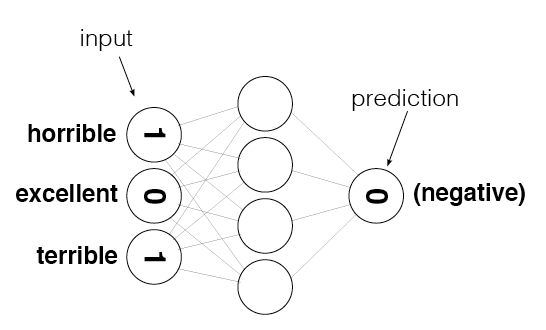

In [34]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

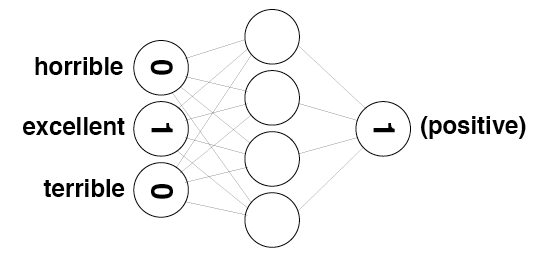

In [34]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [35]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab =set([voc for voc, _  in total_counts.most_common()])

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [36]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

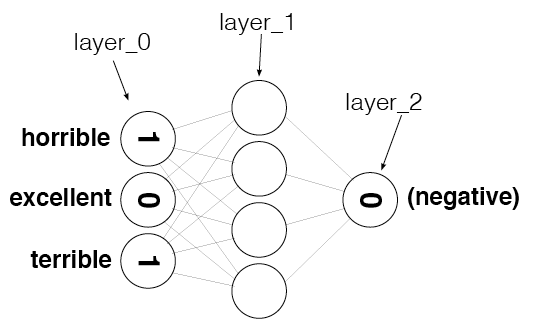

In [37]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [38]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1, vocab_size))

Run the following cell. It should display `(1, 74074)`

In [39]:
layer_0.shape

(1, 74074)

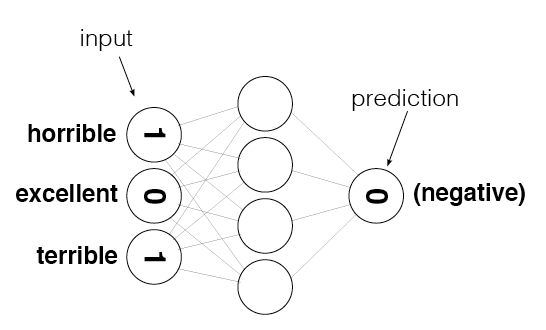

In [40]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [41]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index

{'': 0,
 'snicker': 1,
 'barger': 2,
 'abishai': 3,
 'natives': 4,
 'descendant': 5,
 'cowboys': 6,
 'spouted': 7,
 'mockage': 8,
 'mammoth': 9,
 'hemi': 10,
 'taking': 11,
 'portrays': 12,
 'chord': 13,
 'apprehension': 14,
 'tricktris': 15,
 'olli': 16,
 'recast': 17,
 'buffs': 18,
 'duchovny': 19,
 'affirmed': 20,
 'psychological': 21,
 'stagnation': 22,
 'abatement': 23,
 'divorcing': 24,
 'peacefully': 25,
 'bbca': 26,
 'apalling': 27,
 'argentin': 28,
 'tastelessness': 29,
 'bookings': 30,
 'ticklish': 31,
 'mendona': 32,
 'bierstadt': 33,
 'auteil': 34,
 'psychologizing': 35,
 'shirely': 36,
 'audi': 37,
 'generality': 38,
 'discovered': 39,
 'foresee': 40,
 'contractor': 41,
 'ragneks': 42,
 'encroached': 43,
 'stitzer': 44,
 'rocketeer': 45,
 'hogs': 46,
 'raring': 47,
 'province': 48,
 'appaloosa': 49,
 'nandjiwarra': 50,
 'anbuchelvan': 51,
 'underpins': 52,
 'summer': 53,
 'cheoreography': 54,
 'coote': 55,
 'hypnotizes': 56,
 'hoshi': 57,
 'torsos': 58,
 'waggoner': 59,
 '

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [44]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    
    # TODO: count how many times each word is used in the given review and store the resultsin layer_0
    for word in review.split(' '):
        index = word2index[word]
        layer_0[0, index] += 1

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [45]:
update_input_layer(reviews[0])
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [46]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == 'POSITIVE':
        return 1
    else:
        return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [47]:
labels[0]

'POSITIVE'

In [48]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [49]:
labels[1]

'NEGATIVE'

In [50]:
get_target_for_label(labels[1])

0

In [51]:
aa =  np.array([[1 ,2], [2,4]])

In [52]:
aa[0,1]

2

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [53]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        # populate review_vocab with all of the words in the given reviews
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
    
        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # The input layer, a two-dimensional matrix with shape 1 x input_nodes
        self.layer_0 = np.zeros((1,input_nodes))
    
    def update_input_layer(self,review):

        # clear out previous state, reset the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            # NOTE: This if-check was not in the version of this method created in Project 2,
            #       and it appears in Andrew's Project 3 solution without explanation. 
            #       It simply ensures the word is actually a key in word2index before
            #       accessing it, which is important because accessing an invalid key
            #       with raise an exception in Python. This allows us to ignore unknown
            #       words encountered in new reviews.
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###

            # Input Layer
            self.update_input_layer(review)

            # Hidden layer
            layer_1 = self.layer_0.dot(self.weights_0_1)

            # Output layer
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            
            layer_2_delta = (layer_2 - self.get_target_for_label(label)) * self.sigmoid_output_2_derivative(layer_2)
            layer_1_delta = np.matmul(layer_2_delta, (self.weights_1_2.T)) # hidden layer gradients - no nonlinearity so it's the same as the error

            # Update the weights
            self.weights_1_2 -= (layer_2_delta) * (layer_1.T)* self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= (layer_1_delta) * (self.layer_0.T) * self.learning_rate # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        # Input Layer
        self.update_input_layer(review.lower())

        # Hidden layer
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [54]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [55]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:13.5% Speed(reviews/sec):659.5 #Correct:68 #Tested:136 Testing Accuracy:50.0%

Progress:30.0% Speed(reviews/sec):748.0 #Correct:151 #Tested:301 Testing Accuracy:50.1%

Progress:45.7% Speed(reviews/sec):750.9 #Correct:229 #Tested:458 Testing Accuracy:50.0%

Progress:59.1% Speed(reviews/sec):715.6 #Correct:296 #Tested:592 Testing Accuracy:50.0%

Progress:75.4% Speed(reviews/sec):743.1 #Correct:378 #Tested:755 Testing Accuracy:50.0%

Progress:91.7% Speed(reviews/sec):744.8 #Correct:459 #Tested:918 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):738.8 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [50]:
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):146.1 #Correct:1251 #Trained:2501 Training Accuracy:50.0%
Progress:20.8% Speed(reviews/sec):146.7 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Progress:31.2% Speed(reviews/sec):144.6 #Correct:3751 #Trained:7501 Training Accuracy:50.0%
Progress:41.6% Speed(reviews/sec):145.9 #Correct:5001 #Trained:10001 Training Accuracy:50.0%
Progress:52.0% Speed(reviews/sec):146.5 #Correct:6251 #Trained:12501 Training Accuracy:50.0%
Progress:62.5% Speed(reviews/sec):147.1 #Correct:7501 #Trained:15001 Training Accuracy:50.0%
Progress:72.9% Speed(reviews/sec):147.6 #Correct:8751 #Trained:17501 Training Accuracy:50.0%
Progress:83.3% Speed(reviews/sec):147.9 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Progress:93.7% Speed(reviews/sec):148.2 #Correct:11251 #Trained:22501 Training Accuracy:50.0%
Progress:99.9% Speed(reviews/sec):148.3 #Correct:12000 #Trained:24000 Training Ac

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [51]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):150.1 #Correct:1251 #Trained:2501 Training Accuracy:50.0%
Progress:20.8% Speed(reviews/sec):149.3 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Progress:31.2% Speed(reviews/sec):141.0 #Correct:3751 #Trained:7501 Training Accuracy:50.0%
Progress:41.6% Speed(reviews/sec):137.7 #Correct:5001 #Trained:10001 Training Accuracy:50.0%
Progress:52.0% Speed(reviews/sec):135.8 #Correct:6251 #Trained:12501 Training Accuracy:50.0%
Progress:62.5% Speed(reviews/sec):134.3 #Correct:7501 #Trained:15001 Training Accuracy:50.0%
Progress:72.9% Speed(reviews/sec):133.3 #Correct:8751 #Trained:17501 Training Accuracy:50.0%
Progress:83.3% Speed(reviews/sec):132.8 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Progress:93.7% Speed(reviews/sec):132.4 #Correct:11251 #Trained:22501 Training Accuracy:50.0%
Progress:99.9% Speed(reviews/sec):132.2 #Correct:12000 #Trained:24000 Training Ac

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [56]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])
#print(mlp.word2index)
print(mlp.label2index)

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):89.78 #Correct:1266 #Trained:2501 Training Accuracy:50.6%
Progress:20.8% Speed(reviews/sec):94.19 #Correct:2632 #Trained:5001 Training Accuracy:52.6%
Progress:31.2% Speed(reviews/sec):95.99 #Correct:4018 #Trained:7501 Training Accuracy:53.5%
Progress:35.4% Speed(reviews/sec):95.61 #Correct:4615 #Trained:8503 Training Accuracy:54.2%

KeyboardInterrupt: 

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

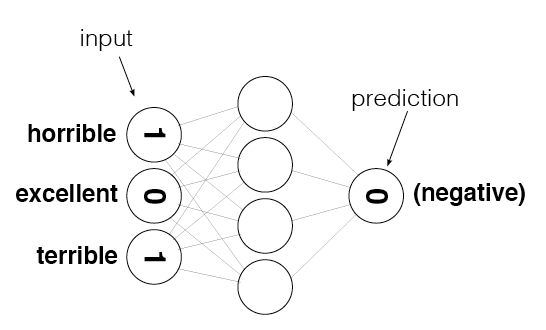

In [57]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [58]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [59]:
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

In [60]:
review_counter = Counter()

In [61]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [62]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [63]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
#       -Modify it to reduce noise, like in the video 
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        # populate review_vocab with all of the words in the given reviews
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
    
        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # The input layer, a two-dimensional matrix with shape 1 x input_nodes
        self.layer_0 = np.zeros((1,input_nodes))
    
    def update_input_layer(self,review):

        # clear out previous state, reset the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            # NOTE: This if-check was not in the version of this method created in Project 2,
            #       and it appears in Andrew's Project 3 solution without explanation. 
            #       It simply ensures the word is actually a key in word2index before
            #       accessing it, which is important because accessing an invalid key
            #       with raise an exception in Python. This allows us to ignore unknown
            #       words encountered in new reviews.
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###

            # Input Layer
            self.update_input_layer(review)

            # Hidden layer
            layer_1 = self.layer_0.dot(self.weights_0_1)

            # Output layer
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            
            layer_2_delta = (layer_2 - self.get_target_for_label(label)) * self.sigmoid_output_2_derivative(layer_2)
            layer_1_delta = np.matmul(layer_2_delta, (self.weights_1_2.T)) # hidden layer gradients - no nonlinearity so it's the same as the error

            # Update the weights
            self.weights_1_2 -= (layer_2_delta) * (layer_1.T)* self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= (layer_1_delta) * (self.layer_0.T) * self.learning_rate # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        
        # Input Layer
        self.update_input_layer(review.lower())

        # Hidden layer
        layer_1 = self.layer_0.dot(self.weights_0_1)

        # Output layer
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [64]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):100.3 #Correct:1820 #Trained:2501 Training Accuracy:72.7%
Progress:20.8% Speed(reviews/sec):90.40 #Correct:3787 #Trained:5001 Training Accuracy:75.7%
Progress:31.2% Speed(reviews/sec):86.65 #Correct:5879 #Trained:7501 Training Accuracy:78.3%
Progress:41.6% Speed(reviews/sec):85.36 #Correct:8015 #Trained:10001 Training Accuracy:80.1%
Progress:52.0% Speed(reviews/sec):84.49 #Correct:10144 #Trained:12501 Training Accuracy:81.1%
Progress:62.5% Speed(reviews/sec):83.82 #Correct:12266 #Trained:15001 Training Accuracy:81.7%
Progress:72.9% Speed(reviews/sec):83.33 #Correct:14388 #Trained:17501 Training Accuracy:82.2%
Progress:83.3% Speed(reviews/sec):82.91 #Correct:16568 #Trained:20001 Training Accuracy:82.8%
Progress:93.7% Speed(reviews/sec):82.62 #Correct:18765 #Trained:22501 Training Accuracy:83.3%
Progress:99.9% Speed(reviews/sec):82.42 #Correct:20084 #Trained:24000 Training

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [65]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:12.2% Speed(reviews/sec):606.5 #Correct:108 #Tested:123 Testing Accuracy:87.8%

Progress:24.4% Speed(reviews/sec):605.7 #Correct:216 #Tested:245 Testing Accuracy:88.1%

Progress:35.5% Speed(reviews/sec):587.8 #Correct:313 #Tested:356 Testing Accuracy:87.9%

Progress:45.9% Speed(reviews/sec):568.0 #Correct:405 #Tested:460 Testing Accuracy:88.0%

Progress:58.7% Speed(reviews/sec):580.7 #Correct:515 #Tested:588 Testing Accuracy:87.5%

Progress:72.1% Speed(reviews/sec):594.7 #Correct:620 #Tested:722 Testing Accuracy:85.8%

Progress:83.7% Speed(reviews/sec):591.9 #Correct:711 #Tested:838 Testing Accuracy:84.8%

Progress:97.4% Speed(reviews/sec):602.8 #Correct:831 #Tested:975 Testing Accuracy:85.2%

Progress:99.9% Speed(reviews/sec):603.5 #Correct:853 #Tested:1000 Testing Accuracy:85.3%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

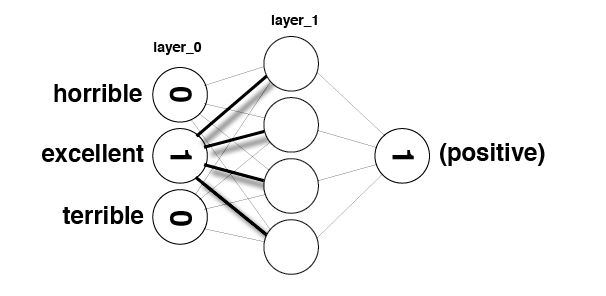

In [66]:
Image(filename='sentiment_network_sparse.png')

In [67]:
layer_0 = np.zeros(10)

In [68]:
layer_0

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [69]:
layer_0[4] = 1
layer_0[9] = 1

In [70]:
layer_0

array([ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.])

In [71]:
weights_0_1 = np.random.randn(10,5)

In [72]:
layer_0.dot(weights_0_1)

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [73]:
indices = [4,9]

In [74]:
layer_1 = np.zeros(5)

In [75]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [76]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

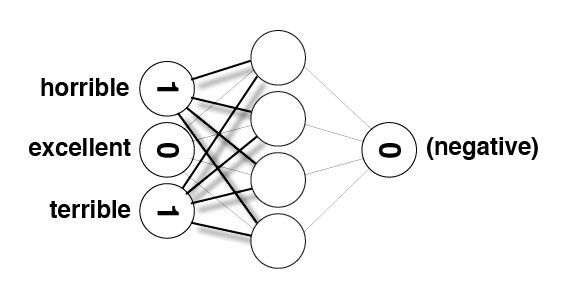

In [77]:
Image(filename='sentiment_network_sparse_2.png')

In [78]:
layer_1 = np.zeros(5)

In [79]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [80]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [29]:
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions 

import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        # populate review_vocab with all of the words in the given reviews
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
    
        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # The input layer, a two-dimensional matrix with shape 1 x input_nodes
        self.layer_1 = np.zeros((1,hidden_nodes))
    

    
    
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    def train(self, training_reviews_raw, training_labels):
        training_reviews = [] 
        for i in range(len(training_reviews_raw)):
            review = training_reviews_raw[i]
            indx  = set()
            for word in review.split(' '):
                indx.add(self.word2index[word])
            training_reviews.append(list(indx))
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###



            # Hidden layer
            self.layer_1 *=  0
            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Output layer
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            
            layer_2_delta = (layer_2 - self.get_target_for_label(label)) * self.sigmoid_output_2_derivative(layer_2)
            layer_1_delta = np.matmul(layer_2_delta, (self.weights_1_2.T)) # hidden layer gradients - no nonlinearity so it's the same as the error
            print(layer_1_delta.shape)
            print(self.weights_0_1[review[0]].shape)
            # Update the weights
            self.weights_1_2 -= (layer_2_delta) * (self.layer_1.T)* self.learning_rate # update hidden-to-output weights with gradient descent step
            for index in review:
                self.weights_0_1[index] -= np.squeeze((layer_1_delta) * self.learning_rate) # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        self.layer_1 *=  0
        # Input Layer
        indx  = set()
        for word in review.lower().split(' '):
            if word in self.word2index.keys():
                indx.add(self.word2index[word])
        
        for index in list(indx):
                self.layer_1 += self.weights_0_1[index]

            # Output layer
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to recreate the network and train it once again.

In [30]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

(1, 10)
(10,)
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
(1, 10)
(10,)
Progress:0.00% Speed(reviews/sec):499.4 #Correct:1 #Trained:2 Training Accuracy:50.0%(1, 10)
(10,)
Progress:0.00% Speed(reviews/sec):666.3 #Correct:2 #Trained:3 Training Accuracy:66.6%(1, 10)
(10,)
Progress:0.01% Speed(reviews/sec):499.6 #Correct:2 #Trained:4 Training Accuracy:50.0%(1, 10)
(10,)
Progress:0.01% Speed(reviews/sec):571.0 #Correct:3 #Trained:5 Training Accuracy:60.0%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):623.2 #Correct:3 #Trained:6 Training Accuracy:50.0%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):747.8 #Correct:3 #Trained:7 Training Accuracy:42.8%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):777.2 #Correct:3 #Trained:8 Training Accuracy:37.5%(1, 10)
(10,)
Progress:0.03% Speed(reviews/sec):799.4 #Correct:4 #Trained:9 Training Accuracy:44.4%(1, 10)
(10,)
Progress:0.03% Speed(reviews/sec):817.6 #Correct:4 #Trained:10 Training Accuracy:40.0%(1, 10)
(10

Progress:1.08% Speed(reviews/sec):979.0 #Correct:155 #Trained:262 Training Accuracy:59.1%(1, 10)
(10,)
Progress:1.09% Speed(reviews/sec):980.9 #Correct:155 #Trained:263 Training Accuracy:58.9%(1, 10)
(10,)
Progress:1.09% Speed(reviews/sec):982.8 #Correct:155 #Trained:264 Training Accuracy:58.7%(1, 10)
(10,)
Progress:1.1% Speed(reviews/sec):982.8 #Correct:156 #Trained:265 Training Accuracy:58.8%(1, 10)
(10,)
Progress:1.10% Speed(reviews/sec):982.9 #Correct:157 #Trained:266 Training Accuracy:59.0%(1, 10)
(10,)
Progress:1.10% Speed(reviews/sec):984.8 #Correct:158 #Trained:267 Training Accuracy:59.1%(1, 10)
(10,)
Progress:1.11% Speed(reviews/sec):984.8 #Correct:159 #Trained:268 Training Accuracy:59.3%(1, 10)
(10,)
Progress:1.11% Speed(reviews/sec):983.1 #Correct:160 #Trained:269 Training Accuracy:59.4%(1, 10)
(10,)
Progress:1.12% Speed(reviews/sec):984.9 #Correct:160 #Trained:270 Training Accuracy:59.2%(1, 10)
(10,)
Progress:1.12% Speed(reviews/sec):985.0 #Correct:161 #Trained:271 Training

Progress:2.77% Speed(reviews/sec):878.6 #Correct:418 #Trained:667 Training Accuracy:62.6%(1, 10)
(10,)
Progress:2.77% Speed(reviews/sec):877.6 #Correct:419 #Trained:668 Training Accuracy:62.7%(1, 10)
(10,)
Progress:2.78% Speed(reviews/sec):878.9 #Correct:420 #Trained:669 Training Accuracy:62.7%(1, 10)
(10,)
Progress:2.78% Speed(reviews/sec):879.1 #Correct:421 #Trained:670 Training Accuracy:62.8%(1, 10)
(10,)
Progress:2.79% Speed(reviews/sec):879.3 #Correct:422 #Trained:671 Training Accuracy:62.8%(1, 10)
(10,)
Progress:2.79% Speed(reviews/sec):879.4 #Correct:422 #Trained:672 Training Accuracy:62.7%(1, 10)
(10,)
Progress:2.8% Speed(reviews/sec):880.7 #Correct:423 #Trained:673 Training Accuracy:62.8%(1, 10)
(10,)
Progress:2.80% Speed(reviews/sec):880.3 #Correct:423 #Trained:674 Training Accuracy:62.7%(1, 10)
(10,)
Progress:2.80% Speed(reviews/sec):881.0 #Correct:423 #Trained:675 Training Accuracy:62.6%(1, 10)
(10,)
Progress:2.81% Speed(reviews/sec):881.2 #Correct:424 #Trained:676 Training

(10,)
Progress:4.45% Speed(reviews/sec):799.3 #Correct:711 #Trained:1069 Training Accuracy:66.5%(1, 10)
(10,)
Progress:4.45% Speed(reviews/sec):800.1 #Correct:711 #Trained:1070 Training Accuracy:66.4%(1, 10)
(10,)
Progress:4.45% Speed(reviews/sec):800.2 #Correct:711 #Trained:1071 Training Accuracy:66.3%(1, 10)
(10,)
Progress:4.46% Speed(reviews/sec):800.4 #Correct:712 #Trained:1072 Training Accuracy:66.4%(1, 10)
(10,)
Progress:4.46% Speed(reviews/sec):800.5 #Correct:713 #Trained:1073 Training Accuracy:66.4%(1, 10)
(10,)
Progress:4.47% Speed(reviews/sec):800.7 #Correct:714 #Trained:1074 Training Accuracy:66.4%(1, 10)
(10,)
Progress:4.47% Speed(reviews/sec):800.8 #Correct:715 #Trained:1075 Training Accuracy:66.5%(1, 10)
(10,)
Progress:4.47% Speed(reviews/sec):801.0 #Correct:716 #Trained:1076 Training Accuracy:66.5%(1, 10)
(10,)
Progress:4.48% Speed(reviews/sec):801.1 #Correct:717 #Trained:1077 Training Accuracy:66.5%(1, 10)
(10,)
Progress:4.48% Speed(reviews/sec):801.3 #Correct:718 #Trai

Progress:6.38% Speed(reviews/sec):799.4 #Correct:1063 #Trained:1533 Training Accuracy:69.3%(1, 10)
(10,)
Progress:6.38% Speed(reviews/sec):799.6 #Correct:1064 #Trained:1534 Training Accuracy:69.3%(1, 10)
(10,)
Progress:6.39% Speed(reviews/sec):800.1 #Correct:1065 #Trained:1535 Training Accuracy:69.3%(1, 10)
(10,)
Progress:6.39% Speed(reviews/sec):800.2 #Correct:1066 #Trained:1536 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.4% Speed(reviews/sec):800.3 #Correct:1067 #Trained:1537 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.40% Speed(reviews/sec):800.0 #Correct:1068 #Trained:1538 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.40% Speed(reviews/sec):800.1 #Correct:1069 #Trained:1539 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.41% Speed(reviews/sec):800.2 #Correct:1069 #Trained:1540 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.41% Speed(reviews/sec):800.3 #Correct:1070 #Trained:1541 Training Accuracy:69.4%(1, 10)
(10,)
Progress:6.42% Speed(reviews/sec):800.4 #Correct:1070 #T

(10,)
Progress:7.81% Speed(reviews/sec):801.1 #Correct:1326 #Trained:1876 Training Accuracy:70.6%(1, 10)
(10,)
Progress:7.81% Speed(reviews/sec):801.2 #Correct:1327 #Trained:1877 Training Accuracy:70.6%(1, 10)
(10,)
Progress:7.82% Speed(reviews/sec):800.9 #Correct:1328 #Trained:1878 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.82% Speed(reviews/sec):800.7 #Correct:1329 #Trained:1879 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.82% Speed(reviews/sec):800.8 #Correct:1330 #Trained:1880 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.83% Speed(reviews/sec):800.9 #Correct:1330 #Trained:1881 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.83% Speed(reviews/sec):801.3 #Correct:1331 #Trained:1882 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.84% Speed(reviews/sec):801.0 #Correct:1332 #Trained:1883 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.84% Speed(reviews/sec):801.1 #Correct:1333 #Trained:1884 Training Accuracy:70.7%(1, 10)
(10,)
Progress:7.85% Speed(reviews/sec):801.2 #Correct:

(10,)
Progress:9.42% Speed(reviews/sec):798.8 #Correct:1645 #Trained:2264 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.43% Speed(reviews/sec):799.1 #Correct:1646 #Trained:2265 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.43% Speed(reviews/sec):798.9 #Correct:1646 #Trained:2266 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.44% Speed(reviews/sec):799.0 #Correct:1646 #Trained:2267 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.44% Speed(reviews/sec):799.0 #Correct:1647 #Trained:2268 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.45% Speed(reviews/sec):799.1 #Correct:1648 #Trained:2269 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.45% Speed(reviews/sec):798.9 #Correct:1648 #Trained:2270 Training Accuracy:72.5%(1, 10)
(10,)
Progress:9.45% Speed(reviews/sec):799.0 #Correct:1649 #Trained:2271 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.46% Speed(reviews/sec):798.8 #Correct:1650 #Trained:2272 Training Accuracy:72.6%(1, 10)
(10,)
Progress:9.46% Speed(reviews/sec):798.6 #Correct:

Progress:11.0% Speed(reviews/sec):787.5 #Correct:1958 #Trained:2662 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.0% Speed(reviews/sec):787.4 #Correct:1959 #Trained:2663 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.0% Speed(reviews/sec):787.4 #Correct:1960 #Trained:2664 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.7 #Correct:1961 #Trained:2665 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.5 #Correct:1962 #Trained:2666 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.6 #Correct:1963 #Trained:2667 Training Accuracy:73.6%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.9 #Correct:1963 #Trained:2668 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.5 #Correct:1964 #Trained:2669 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.1 #Correct:1965 #Trained:2670 Training Accuracy:73.5%(1, 10)
(10,)
Progress:11.1% Speed(reviews/sec):786.1 #Correct:1966 #

Progress:12.7% Speed(reviews/sec):784.4 #Correct:2268 #Trained:3057 Training Accuracy:74.1%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.4 #Correct:2269 #Trained:3058 Training Accuracy:74.1%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.5 #Correct:2270 #Trained:3059 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.5 #Correct:2271 #Trained:3060 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.4 #Correct:2272 #Trained:3061 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.7 #Correct:2273 #Trained:3062 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.3 #Correct:2274 #Trained:3063 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.4 #Correct:2275 #Trained:3064 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.4 #Correct:2275 #Trained:3065 Training Accuracy:74.2%(1, 10)
(10,)
Progress:12.7% Speed(reviews/sec):784.5 #Correct:2275 #

Progress:14.4% Speed(reviews/sec):782.2 #Correct:2599 #Trained:3473 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.2 #Correct:2600 #Trained:3474 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.3 #Correct:2601 #Trained:3475 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.3 #Correct:2602 #Trained:3476 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.2 #Correct:2603 #Trained:3477 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.2 #Correct:2604 #Trained:3478 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.1 #Correct:2605 #Trained:3479 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.4% Speed(reviews/sec):782.2 #Correct:2606 #Trained:3480 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.5% Speed(reviews/sec):781.9 #Correct:2606 #Trained:3481 Training Accuracy:74.8%(1, 10)
(10,)
Progress:14.5% Speed(reviews/sec):781.9 #Correct:2607 #

Progress:16.3% Speed(reviews/sec):778.8 #Correct:2960 #Trained:3929 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.4 #Correct:2961 #Trained:3930 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.6 #Correct:2962 #Trained:3931 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.7 #Correct:2963 #Trained:3932 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.7 #Correct:2964 #Trained:3933 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.8 #Correct:2965 #Trained:3934 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.9 #Correct:2966 #Trained:3935 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.3% Speed(reviews/sec):778.8 #Correct:2967 #Trained:3936 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.4% Speed(reviews/sec):779.0 #Correct:2968 #Trained:3937 Training Accuracy:75.3%(1, 10)
(10,)
Progress:16.4% Speed(reviews/sec):779.1 #Correct:2969 #

Progress:18.0% Speed(reviews/sec):781.8 #Correct:3277 #Trained:4324 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):781.8 #Correct:3277 #Trained:4325 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):781.9 #Correct:3277 #Trained:4326 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.1 #Correct:3277 #Trained:4327 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.1 #Correct:3278 #Trained:4328 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.1 #Correct:3279 #Trained:4329 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.2 #Correct:3280 #Trained:4330 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.2 #Correct:3281 #Trained:4331 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.3 #Correct:3282 #Trained:4332 Training Accuracy:75.7%(1, 10)
(10,)
Progress:18.0% Speed(reviews/sec):782.4 #Correct:3282 #

Progress:19.4% Speed(reviews/sec):775.1 #Correct:3540 #Trained:4665 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3540 #Trained:4666 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.1 #Correct:3541 #Trained:4667 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3542 #Trained:4668 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3542 #Trained:4669 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3543 #Trained:4670 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.3 #Correct:3543 #Trained:4671 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3544 #Trained:4672 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.2 #Correct:3545 #Trained:4673 Training Accuracy:75.8%(1, 10)
(10,)
Progress:19.4% Speed(reviews/sec):775.1 #Correct:3546 #

Progress:21.0% Speed(reviews/sec):770.1 #Correct:3863 #Trained:5063 Training Accuracy:76.2%(1, 10)
(10,)
Progress:21.0% Speed(reviews/sec):770.0 #Correct:3864 #Trained:5064 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.1 #Correct:3865 #Trained:5065 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.2 #Correct:3865 #Trained:5066 Training Accuracy:76.2%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.2 #Correct:3866 #Trained:5067 Training Accuracy:76.2%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.3 #Correct:3867 #Trained:5068 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.4 #Correct:3868 #Trained:5069 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.4 #Correct:3869 #Trained:5070 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.5 #Correct:3870 #Trained:5071 Training Accuracy:76.3%(1, 10)
(10,)
Progress:21.1% Speed(reviews/sec):770.5 #Correct:3871 #

(10,)
Progress:22.7% Speed(reviews/sec):753.8 #Correct:4188 #Trained:5462 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.8 #Correct:4189 #Trained:5463 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.8 #Correct:4190 #Trained:5464 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.7 #Correct:4190 #Trained:5465 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.6 #Correct:4191 #Trained:5466 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.6 #Correct:4192 #Trained:5467 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.6 #Correct:4193 #Trained:5468 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.5 #Correct:4194 #Trained:5469 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.6 #Correct:4194 #Trained:5470 Training Accuracy:76.6%(1, 10)
(10,)
Progress:22.7% Speed(reviews/sec):753.6 #Correct:

(10,)
Progress:24.4% Speed(reviews/sec):722.0 #Correct:4524 #Trained:5861 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.0 #Correct:4525 #Trained:5862 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):721.9 #Correct:4526 #Trained:5863 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.0 #Correct:4527 #Trained:5864 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.0 #Correct:4527 #Trained:5865 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.0 #Correct:4528 #Trained:5866 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.2 #Correct:4529 #Trained:5867 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.2 #Correct:4530 #Trained:5868 Training Accuracy:77.1%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.1 #Correct:4531 #Trained:5869 Training Accuracy:77.2%(1, 10)
(10,)
Progress:24.4% Speed(reviews/sec):722.2 #Correct:

Progress:26.0% Speed(reviews/sec):712.2 #Correct:4849 #Trained:6258 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.2 #Correct:4849 #Trained:6259 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.3 #Correct:4850 #Trained:6260 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.3 #Correct:4851 #Trained:6261 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.4 #Correct:4852 #Trained:6262 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.4 #Correct:4853 #Trained:6263 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.0% Speed(reviews/sec):712.5 #Correct:4854 #Trained:6264 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.1% Speed(reviews/sec):712.5 #Correct:4855 #Trained:6265 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.1% Speed(reviews/sec):712.5 #Correct:4856 #Trained:6266 Training Accuracy:77.4%(1, 10)
(10,)
Progress:26.1% Speed(reviews/sec):712.6 #Correct:4857 #

(10,)
Progress:27.7% Speed(reviews/sec):716.2 #Correct:5198 #Trained:6664 Training Accuracy:78.0%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.3 #Correct:5199 #Trained:6665 Training Accuracy:78.0%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.2 #Correct:5200 #Trained:6666 Training Accuracy:78.0%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.2 #Correct:5200 #Trained:6667 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.3 #Correct:5200 #Trained:6668 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.2 #Correct:5201 #Trained:6669 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):716.3 #Correct:5201 #Trained:6670 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):715.9 #Correct:5202 #Trained:6671 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.7% Speed(reviews/sec):715.8 #Correct:5203 #Trained:6672 Training Accuracy:77.9%(1, 10)
(10,)
Progress:27.8% Speed(reviews/sec):715.5 #Correct:

Progress:29.4% Speed(reviews/sec):708.9 #Correct:5536 #Trained:7063 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.5 #Correct:5537 #Trained:7064 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.5 #Correct:5538 #Trained:7065 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.5 #Correct:5539 #Trained:7066 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.5 #Correct:5540 #Trained:7067 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.2 #Correct:5541 #Trained:7068 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.0 #Correct:5542 #Trained:7069 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.0 #Correct:5543 #Trained:7070 Training Accuracy:78.4%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):708.0 #Correct:5543 #Trained:7071 Training Accuracy:78.3%(1, 10)
(10,)
Progress:29.4% Speed(reviews/sec):707.8 #Correct:5544 #

(10,)
Progress:31.0% Speed(reviews/sec):691.8 #Correct:5866 #Trained:7464 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.9 #Correct:5867 #Trained:7465 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.9 #Correct:5868 #Trained:7466 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.9 #Correct:5869 #Trained:7467 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.9 #Correct:5869 #Trained:7468 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.9 #Correct:5870 #Trained:7469 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.7 #Correct:5871 #Trained:7470 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.6 #Correct:5872 #Trained:7471 Training Accuracy:78.5%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.6 #Correct:5873 #Trained:7472 Training Accuracy:78.6%(1, 10)
(10,)
Progress:31.1% Speed(reviews/sec):691.6 #Correct:

Progress:32.7% Speed(reviews/sec):684.0 #Correct:6203 #Trained:7857 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):683.9 #Correct:6204 #Trained:7858 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6205 #Trained:7859 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6205 #Trained:7860 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6206 #Trained:7861 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6207 #Trained:7862 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6207 #Trained:7863 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):684.0 #Correct:6208 #Trained:7864 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):683.9 #Correct:6209 #Trained:7865 Training Accuracy:78.9%(1, 10)
(10,)
Progress:32.7% Speed(reviews/sec):683.9 #Correct:6209 #

Progress:34.4% Speed(reviews/sec):686.3 #Correct:6556 #Trained:8280 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.3 #Correct:6557 #Trained:8281 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.3 #Correct:6558 #Trained:8282 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.3 #Correct:6559 #Trained:8283 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.3 #Correct:6560 #Trained:8284 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.3 #Correct:6560 #Trained:8285 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.4 #Correct:6561 #Trained:8286 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.4 #Correct:6562 #Trained:8287 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.4 #Correct:6563 #Trained:8288 Training Accuracy:79.1%(1, 10)
(10,)
Progress:34.5% Speed(reviews/sec):686.4 #Correct:6564 #

(10,)
Progress:36.1% Speed(reviews/sec):689.8 #Correct:6877 #Trained:8668 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.8 #Correct:6878 #Trained:8669 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6879 #Trained:8670 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6880 #Trained:8671 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6881 #Trained:8672 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6882 #Trained:8673 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6883 #Trained:8674 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:6884 #Trained:8675 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):690.0 #Correct:6885 #Trained:8676 Training Accuracy:79.3%(1, 10)
(10,)
Progress:36.1% Speed(reviews/sec):689.9 #Correct:

Progress:37.8% Speed(reviews/sec):683.8 #Correct:7233 #Trained:9081 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.8 #Correct:7234 #Trained:9082 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.8 #Correct:7235 #Trained:9083 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.8 #Correct:7236 #Trained:9084 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7237 #Trained:9085 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7237 #Trained:9086 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7238 #Trained:9087 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7239 #Trained:9088 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7240 #Trained:9089 Training Accuracy:79.6%(1, 10)
(10,)
Progress:37.8% Speed(reviews/sec):683.9 #Correct:7241 #

(10,)
Progress:39.4% Speed(reviews/sec):687.0 #Correct:7560 #Trained:9461 Training Accuracy:79.9%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.0 #Correct:7561 #Trained:9462 Training Accuracy:79.9%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.0 #Correct:7562 #Trained:9463 Training Accuracy:79.9%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.1 #Correct:7562 #Trained:9464 Training Accuracy:79.9%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.1 #Correct:7563 #Trained:9465 Training Accuracy:79.9%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.1 #Correct:7563 #Trained:9466 Training Accuracy:79.8%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.1 #Correct:7564 #Trained:9467 Training Accuracy:79.8%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.2 #Correct:7564 #Trained:9468 Training Accuracy:79.8%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.2 #Correct:7565 #Trained:9469 Training Accuracy:79.8%(1, 10)
(10,)
Progress:39.4% Speed(reviews/sec):687.2 #Correct:

(10,)
Progress:41.1% Speed(reviews/sec):685.2 #Correct:7920 #Trained:9874 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.2 #Correct:7921 #Trained:9875 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7922 #Trained:9876 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7923 #Trained:9877 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7924 #Trained:9878 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7925 #Trained:9879 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7925 #Trained:9880 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7926 #Trained:9881 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:7927 #Trained:9882 Training Accuracy:80.2%(1, 10)
(10,)
Progress:41.1% Speed(reviews/sec):685.3 #Correct:

Progress:42.8% Speed(reviews/sec):687.7 #Correct:8265 #Trained:10288 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.7 #Correct:8266 #Trained:10289 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.7 #Correct:8267 #Trained:10290 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.7 #Correct:8268 #Trained:10291 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.8 #Correct:8269 #Trained:10292 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.8 #Correct:8270 #Trained:10293 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.8 #Correct:8271 #Trained:10294 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.8 #Correct:8271 #Trained:10295 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.8% Speed(reviews/sec):687.8 #Correct:8271 #Trained:10296 Training Accuracy:80.3%(1, 10)
(10,)
Progress:42.9% Speed(reviews/sec):687.8 #Corre

(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8601 #Trained:10683 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8602 #Trained:10684 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8603 #Trained:10685 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8604 #Trained:10686 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8605 #Trained:10687 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8606 #Trained:10688 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.0 #Correct:8607 #Trained:10689 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.1 #Correct:8608 #Trained:10690 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.1 #Correct:8609 #Trained:10691 Training Accuracy:80.5%(1, 10)
(10,)
Progress:44.5% Speed(reviews/sec):686.1 

Progress:46.0% Speed(reviews/sec):688.2 #Correct:8925 #Trained:11064 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.2 #Correct:8926 #Trained:11065 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.2 #Correct:8927 #Trained:11066 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.2 #Correct:8928 #Trained:11067 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.3 #Correct:8929 #Trained:11068 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.3 #Correct:8930 #Trained:11069 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.4 #Correct:8930 #Trained:11070 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.4 #Correct:8931 #Trained:11071 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.4 #Correct:8931 #Trained:11072 Training Accuracy:80.6%(1, 10)
(10,)
Progress:46.1% Speed(reviews/sec):688.4 #Corre

Progress:47.7% Speed(reviews/sec):691.0 #Correct:9255 #Trained:11457 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.0 #Correct:9256 #Trained:11458 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.1 #Correct:9257 #Trained:11459 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.1 #Correct:9257 #Trained:11460 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.1 #Correct:9258 #Trained:11461 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.1 #Correct:9259 #Trained:11462 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.2 #Correct:9260 #Trained:11463 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.2 #Correct:9261 #Trained:11464 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.3 #Correct:9262 #Trained:11465 Training Accuracy:80.7%(1, 10)
(10,)
Progress:47.7% Speed(reviews/sec):691.3 #Corre

(10,)
Progress:49.4% Speed(reviews/sec):693.5 #Correct:9604 #Trained:11863 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9605 #Trained:11864 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9606 #Trained:11865 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9607 #Trained:11866 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9608 #Trained:11867 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9609 #Trained:11868 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9610 #Trained:11869 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9611 #Trained:11870 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.6 #Correct:9612 #Trained:11871 Training Accuracy:80.9%(1, 10)
(10,)
Progress:49.4% Speed(reviews/sec):693.7 

Progress:51.0% Speed(reviews/sec):694.6 #Correct:9938 #Trained:12255 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9939 #Trained:12256 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.6 #Correct:9940 #Trained:12257 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9940 #Trained:12258 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9941 #Trained:12259 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9942 #Trained:12260 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9943 #Trained:12261 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.7 #Correct:9944 #Trained:12262 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.8 #Correct:9945 #Trained:12263 Training Accuracy:81.0%(1, 10)
(10,)
Progress:51.0% Speed(reviews/sec):694.8 #Corre

(10,)
Progress:52.8% Speed(reviews/sec):697.9 #Correct:10309 #Trained:12685 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):697.9 #Correct:10310 #Trained:12686 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):697.9 #Correct:10311 #Trained:12687 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):698.0 #Correct:10312 #Trained:12688 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):697.9 #Correct:10312 #Trained:12689 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):698.0 #Correct:10313 #Trained:12690 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):698.0 #Correct:10314 #Trained:12691 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):698.0 #Correct:10315 #Trained:12692 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/sec):698.1 #Correct:10316 #Trained:12693 Training Accuracy:81.2%(1, 10)
(10,)
Progress:52.8% Speed(reviews/se

Progress:54.7% Speed(reviews/sec):699.0 #Correct:10698 #Trained:13135 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10698 #Trained:13136 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10699 #Trained:13137 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10700 #Trained:13138 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10701 #Trained:13139 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10702 #Trained:13140 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.1 #Correct:10703 #Trained:13141 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.2 #Correct:10703 #Trained:13142 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699.2 #Correct:10704 #Trained:13143 Training Accuracy:81.4%(1, 10)
(10,)
Progress:54.7% Speed(reviews/sec):699

Progress:56.1% Speed(reviews/sec):701.2 #Correct:10982 #Trained:13467 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10983 #Trained:13468 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10984 #Trained:13469 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10985 #Trained:13470 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10986 #Trained:13471 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10987 #Trained:13472 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10988 #Trained:13473 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10989 #Trained:13474 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701.1 #Correct:10990 #Trained:13475 Training Accuracy:81.5%(1, 10)
(10,)
Progress:56.1% Speed(reviews/sec):701

(10,)
Progress:57.9% Speed(reviews/sec):703.7 #Correct:11380 #Trained:13920 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11381 #Trained:13921 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11382 #Trained:13922 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11382 #Trained:13923 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11383 #Trained:13924 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11384 #Trained:13925 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11385 #Trained:13926 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.7 #Correct:11386 #Trained:13927 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/sec):703.6 #Correct:11386 #Trained:13928 Training Accuracy:81.7%(1, 10)
(10,)
Progress:58.0% Speed(reviews/se

Progress:59.7% Speed(reviews/sec):700.8 #Correct:11736 #Trained:14348 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.7% Speed(reviews/sec):700.7 #Correct:11736 #Trained:14349 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.7% Speed(reviews/sec):700.6 #Correct:11736 #Trained:14350 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.7% Speed(reviews/sec):700.7 #Correct:11737 #Trained:14351 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.7% Speed(reviews/sec):700.7 #Correct:11737 #Trained:14352 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.8% Speed(reviews/sec):700.7 #Correct:11738 #Trained:14353 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.8% Speed(reviews/sec):700.7 #Correct:11739 #Trained:14354 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.8% Speed(reviews/sec):700.7 #Correct:11740 #Trained:14355 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.8% Speed(reviews/sec):700.7 #Correct:11741 #Trained:14356 Training Accuracy:81.7%(1, 10)
(10,)
Progress:59.8% Speed(reviews/sec):700

Progress:61.0% Speed(reviews/sec):701.9 #Correct:11988 #Trained:14659 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.0% Speed(reviews/sec):701.8 #Correct:11989 #Trained:14660 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.0% Speed(reviews/sec):701.9 #Correct:11990 #Trained:14661 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.0% Speed(reviews/sec):701.9 #Correct:11991 #Trained:14662 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.0% Speed(reviews/sec):701.9 #Correct:11992 #Trained:14663 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.0% Speed(reviews/sec):701.9 #Correct:11993 #Trained:14664 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.1% Speed(reviews/sec):701.8 #Correct:11994 #Trained:14665 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.1% Speed(reviews/sec):701.9 #Correct:11995 #Trained:14666 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.1% Speed(reviews/sec):701.8 #Correct:11995 #Trained:14667 Training Accuracy:81.7%(1, 10)
(10,)
Progress:61.1% Speed(reviews/sec):701

Progress:62.7% Speed(reviews/sec):698.7 #Correct:12333 #Trained:15061 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.7 #Correct:12334 #Trained:15062 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.8 #Correct:12335 #Trained:15063 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.7 #Correct:12336 #Trained:15064 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.6 #Correct:12336 #Trained:15065 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.6 #Correct:12337 #Trained:15066 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.7 #Correct:12338 #Trained:15067 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.6 #Correct:12339 #Trained:15068 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698.6 #Correct:12340 #Trained:15069 Training Accuracy:81.8%(1, 10)
(10,)
Progress:62.7% Speed(reviews/sec):698

Progress:64.3% Speed(reviews/sec):698.2 #Correct:12666 #Trained:15454 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.3% Speed(reviews/sec):698.2 #Correct:12667 #Trained:15455 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.3% Speed(reviews/sec):698.2 #Correct:12668 #Trained:15456 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12668 #Trained:15457 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12668 #Trained:15458 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12669 #Trained:15459 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12670 #Trained:15460 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12671 #Trained:15461 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698.2 #Correct:12672 #Trained:15462 Training Accuracy:81.9%(1, 10)
(10,)
Progress:64.4% Speed(reviews/sec):698

Progress:66.0% Speed(reviews/sec):698.3 #Correct:13015 #Trained:15863 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.0% Speed(reviews/sec):698.4 #Correct:13016 #Trained:15864 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.3 #Correct:13017 #Trained:15865 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13018 #Trained:15866 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13019 #Trained:15867 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13020 #Trained:15868 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13021 #Trained:15869 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13021 #Trained:15870 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698.4 #Correct:13022 #Trained:15871 Training Accuracy:82.0%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):698

(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13342 #Trained:16255 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13343 #Trained:16256 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13344 #Trained:16257 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13345 #Trained:16258 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13346 #Trained:16259 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.2 #Correct:13347 #Trained:16260 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13348 #Trained:16261 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13348 #Trained:16262 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/sec):699.3 #Correct:13349 #Trained:16263 Training Accuracy:82.0%(1, 10)
(10,)
Progress:67.7% Speed(reviews/se

Progress:69.8% Speed(reviews/sec):700.4 #Correct:13776 #Trained:16768 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.4 #Correct:13777 #Trained:16769 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.4 #Correct:13778 #Trained:16770 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.4 #Correct:13779 #Trained:16771 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.4 #Correct:13780 #Trained:16772 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.5 #Correct:13780 #Trained:16773 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.5 #Correct:13781 #Trained:16774 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.5 #Correct:13782 #Trained:16775 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.8% Speed(reviews/sec):700.5 #Correct:13782 #Trained:16776 Training Accuracy:82.1%(1, 10)
(10,)
Progress:69.9% Speed(reviews/sec):700

Progress:71.0% Speed(reviews/sec):702.2 #Correct:14024 #Trained:17061 Training Accuracy:82.1%(1, 10)
(10,)
Progress:71.0% Speed(reviews/sec):702.2 #Correct:14025 #Trained:17062 Training Accuracy:82.2%(1, 10)
(10,)
Progress:71.0% Speed(reviews/sec):702.2 #Correct:14026 #Trained:17063 Training Accuracy:82.2%(1, 10)
(10,)
Progress:71.0% Speed(reviews/sec):702.2 #Correct:14027 #Trained:17064 Training Accuracy:82.2%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702.3 #Correct:14027 #Trained:17065 Training Accuracy:82.1%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702.3 #Correct:14028 #Trained:17066 Training Accuracy:82.1%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702.3 #Correct:14029 #Trained:17067 Training Accuracy:82.1%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702.3 #Correct:14030 #Trained:17068 Training Accuracy:82.2%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702.4 #Correct:14031 #Trained:17069 Training Accuracy:82.2%(1, 10)
(10,)
Progress:71.1% Speed(reviews/sec):702

(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14361 #Trained:17451 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14361 #Trained:17452 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14362 #Trained:17453 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14363 #Trained:17454 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14364 #Trained:17455 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14365 #Trained:17456 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14366 #Trained:17457 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14367 #Trained:17458 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/sec):701.9 #Correct:14368 #Trained:17459 Training Accuracy:82.2%(1, 10)
(10,)
Progress:72.7% Speed(reviews/se

(10,)
Progress:74.3% Speed(reviews/sec):702.3 #Correct:14709 #Trained:17856 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.3 #Correct:14710 #Trained:17857 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.3 #Correct:14711 #Trained:17858 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.3 #Correct:14712 #Trained:17859 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.4 #Correct:14713 #Trained:17860 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.4 #Correct:14713 #Trained:17861 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.4 #Correct:14714 #Trained:17862 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.4 #Correct:14715 #Trained:17863 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/sec):702.4 #Correct:14716 #Trained:17864 Training Accuracy:82.3%(1, 10)
(10,)
Progress:74.4% Speed(reviews/se

Progress:76.0% Speed(reviews/sec):701.6 #Correct:15063 #Trained:18254 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15063 #Trained:18255 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15064 #Trained:18256 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.4 #Correct:15065 #Trained:18257 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15066 #Trained:18258 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15066 #Trained:18259 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15067 #Trained:18260 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15068 #Trained:18261 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701.5 #Correct:15069 #Trained:18262 Training Accuracy:82.5%(1, 10)
(10,)
Progress:76.0% Speed(reviews/sec):701

(10,)
Progress:77.7% Speed(reviews/sec):703.0 #Correct:15410 #Trained:18654 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.0 #Correct:15411 #Trained:18655 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.0 #Correct:15412 #Trained:18656 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.0 #Correct:15413 #Trained:18657 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.0 #Correct:15414 #Trained:18658 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.1 #Correct:15415 #Trained:18659 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.1 #Correct:15416 #Trained:18660 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.1 #Correct:15417 #Trained:18661 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/sec):703.1 #Correct:15418 #Trained:18662 Training Accuracy:82.6%(1, 10)
(10,)
Progress:77.7% Speed(reviews/se

Progress:79.4% Speed(reviews/sec):704.0 #Correct:15778 #Trained:19073 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15779 #Trained:19074 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.0 #Correct:15780 #Trained:19075 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15781 #Trained:19076 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15782 #Trained:19077 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15782 #Trained:19078 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15783 #Trained:19079 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.4% Speed(reviews/sec):704.1 #Correct:15784 #Trained:19080 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.5% Speed(reviews/sec):704.1 #Correct:15785 #Trained:19081 Training Accuracy:82.7%(1, 10)
(10,)
Progress:79.5% Speed(reviews/sec):704

(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16137 #Trained:19481 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16138 #Trained:19482 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16139 #Trained:19483 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16140 #Trained:19484 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16141 #Trained:19485 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.8 #Correct:16142 #Trained:19486 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16143 #Trained:19487 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.1% Speed(reviews/sec):705.9 #Correct:16144 #Trained:19488 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.2% Speed(reviews/sec):705.8 #Correct:16145 #Trained:19489 Training Accuracy:82.8%(1, 10)
(10,)
Progress:81.2% Speed(reviews/se

(10,)
Progress:82.7% Speed(reviews/sec):706.0 #Correct:16472 #Trained:19869 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.7% Speed(reviews/sec):706.0 #Correct:16473 #Trained:19870 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.7% Speed(reviews/sec):706.0 #Correct:16474 #Trained:19871 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.7% Speed(reviews/sec):706.0 #Correct:16475 #Trained:19872 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/sec):706.0 #Correct:16476 #Trained:19873 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/sec):706.0 #Correct:16477 #Trained:19874 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/sec):706.0 #Correct:16478 #Trained:19875 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/sec):706.0 #Correct:16479 #Trained:19876 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/sec):706.0 #Correct:16479 #Trained:19877 Training Accuracy:82.9%(1, 10)
(10,)
Progress:82.8% Speed(reviews/se

Progress:84.3% Speed(reviews/sec):706.5 #Correct:16814 #Trained:20256 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16815 #Trained:20257 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16816 #Trained:20258 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16817 #Trained:20259 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16817 #Trained:20260 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16818 #Trained:20261 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16819 #Trained:20262 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16820 #Trained:20263 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706.5 #Correct:16820 #Trained:20264 Training Accuracy:83.0%(1, 10)
(10,)
Progress:84.4% Speed(reviews/sec):706

(10,)
Progress:86.0% Speed(reviews/sec):707.6 #Correct:17153 #Trained:20648 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.6 #Correct:17154 #Trained:20649 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.6 #Correct:17155 #Trained:20650 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17155 #Trained:20651 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17156 #Trained:20652 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17157 #Trained:20653 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17158 #Trained:20654 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17159 #Trained:20655 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/sec):707.7 #Correct:17160 #Trained:20656 Training Accuracy:83.0%(1, 10)
(10,)
Progress:86.0% Speed(reviews/se

Progress:87.7% Speed(reviews/sec):705.9 #Correct:17516 #Trained:21061 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17517 #Trained:21062 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17518 #Trained:21063 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17519 #Trained:21064 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17520 #Trained:21065 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17521 #Trained:21066 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):706.0 #Correct:17522 #Trained:21067 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):705.9 #Correct:17523 #Trained:21068 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):705.9 #Correct:17524 #Trained:21069 Training Accuracy:83.1%(1, 10)
(10,)
Progress:87.7% Speed(reviews/sec):705

Progress:89.7% Speed(reviews/sec):708.1 #Correct:17924 #Trained:21531 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17925 #Trained:21532 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17926 #Trained:21533 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17927 #Trained:21534 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17928 #Trained:21535 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17929 #Trained:21536 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.2 #Correct:17930 #Trained:21537 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.1 #Correct:17931 #Trained:21538 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708.2 #Correct:17932 #Trained:21539 Training Accuracy:83.2%(1, 10)
(10,)
Progress:89.7% Speed(reviews/sec):708

Progress:91.4% Speed(reviews/sec):709.6 #Correct:18299 #Trained:21955 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.4% Speed(reviews/sec):709.6 #Correct:18300 #Trained:21956 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.4% Speed(reviews/sec):709.6 #Correct:18301 #Trained:21957 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.4% Speed(reviews/sec):709.6 #Correct:18302 #Trained:21958 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.4% Speed(reviews/sec):709.6 #Correct:18303 #Trained:21959 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.4% Speed(reviews/sec):709.6 #Correct:18304 #Trained:21960 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.5% Speed(reviews/sec):709.6 #Correct:18305 #Trained:21961 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.5% Speed(reviews/sec):709.6 #Correct:18306 #Trained:21962 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.5% Speed(reviews/sec):709.6 #Correct:18307 #Trained:21963 Training Accuracy:83.3%(1, 10)
(10,)
Progress:91.5% Speed(reviews/sec):709

Progress:92.7% Speed(reviews/sec):710.4 #Correct:18561 #Trained:22257 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18562 #Trained:22258 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18563 #Trained:22259 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18564 #Trained:22260 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18565 #Trained:22261 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18566 #Trained:22262 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18567 #Trained:22263 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18568 #Trained:22264 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710.4 #Correct:18569 #Trained:22265 Training Accuracy:83.3%(1, 10)
(10,)
Progress:92.7% Speed(reviews/sec):710

Progress:94.3% Speed(reviews/sec):710.7 #Correct:18884 #Trained:22647 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.7 #Correct:18885 #Trained:22648 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.7 #Correct:18886 #Trained:22649 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18886 #Trained:22650 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18887 #Trained:22651 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18888 #Trained:22652 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18889 #Trained:22653 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18890 #Trained:22654 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710.8 #Correct:18891 #Trained:22655 Training Accuracy:83.3%(1, 10)
(10,)
Progress:94.3% Speed(reviews/sec):710

(10,)
Progress:96.0% Speed(reviews/sec):711.1 #Correct:19247 #Trained:23054 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.1 #Correct:19248 #Trained:23055 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19249 #Trained:23056 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19250 #Trained:23057 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19250 #Trained:23058 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19251 #Trained:23059 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19251 #Trained:23060 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19251 #Trained:23061 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/sec):711.2 #Correct:19252 #Trained:23062 Training Accuracy:83.4%(1, 10)
(10,)
Progress:96.0% Speed(reviews/se

Progress:97.7% Speed(reviews/sec):711.9 #Correct:19591 #Trained:23455 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):711.9 #Correct:19592 #Trained:23456 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19592 #Trained:23457 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19593 #Trained:23458 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19594 #Trained:23459 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19595 #Trained:23460 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19596 #Trained:23461 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19597 #Trained:23462 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712.0 #Correct:19598 #Trained:23463 Training Accuracy:83.5%(1, 10)
(10,)
Progress:97.7% Speed(reviews/sec):712

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [31]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:13.8% Speed(reviews/sec):1193. #Correct:121 #Tested:139 Testing Accuracy:87.0%

Progress:40.2% Speed(reviews/sec):1249. #Correct:349 #Tested:403 Testing Accuracy:86.6%

Progress:99.9% Speed(reviews/sec):1460. #Correct:852 #Tested:1000 Testing Accuracy:85.2%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

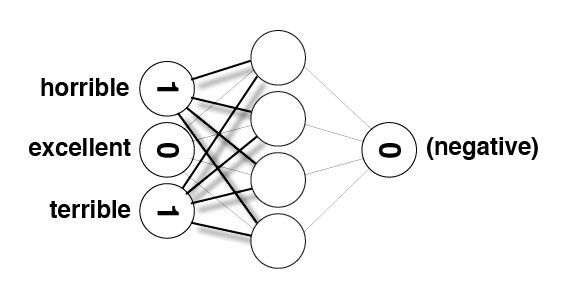

In [35]:
Image(filename='sentiment_network_sparse_2.png')

In [50]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [51]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.9698132995760007),
 ('uwe', -4.6249728132842707),
 ('seagal', -3.6441435602725449),
 ('unwatchable', -3.2580965380214821),
 ('stinker', -3.2088254890146994),
 ('mst', -2.9502698994772336),
 ('incoherent', -2.9368917735310576),
 ('unfunny', -2.6922395950755678),
 ('waste', -2.6193845640165536),
 ('blah', -2.5704288232261625),
 ('horrid', -2.4849066497880004),
 ('pointless', -2.4553061800117097),
 ('atrocious', -2.4259083090260445),
 ('redeeming', -2.3682390632154826),
 ('prom', -2.3608540011180215),
 ('drivel', -2.3470368555648795),
 ('lousy', -2.3075726345050849),
 ('worst', -2.2869878961803778),
 ('laughable', -2.2643638801738479),
 ('awful', -2.2271942470274348),
 ('poorly', -2.2207550747464135),
 ('wasting', -2.2046046846338418),
 ('remotely', -2.1972245773362196),
 ('existent', -2.0794415416798357),
 ('boredom', -1.9951003932460849),
 ('miserably', -1.9924301646902063),
 ('sucks', -1.9870682215488209),
 ('uninspired', -1.9832976811269336),
 ('lame', -1.981767458946166)

In [53]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [61]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [55]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [56]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [82]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 

import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews,labels,hidden_nodes = 10, learning_rate = 0.1, min_count = 500, polarity_cutoff =0.05):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, min_count, polarity_cutoff)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, min_count, polarity_cutoff):
        
        # populate review_vocab with all of the words in the given reviews
        total_counter = Counter()
        positive_counter = Counter()
        negative_counter = Counter()
        pos_neg_ratios = Counter()
        for i in range(len(reviews)):
            for word in reviews[i].split(' '):
                total_counter[word] += 1
                if labels[i] == 'POSITIVE':
                    positive_counter[word] += 1
                else:
                    negative_counter[word] += 1
        for word in total_counter.most_common():
            if word[1] > 100:
                pos_neg_ratios[word[0]] = np.log(positive_counter[word[0]]/ float(negative_counter[word[0]]+1))
            
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                if(total_counter[word] >= min_count and 
                   np.abs(pos_neg_ratios[word]) > polarity_cutoff):
                    review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # These are the weights between the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
    
        # These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # The input layer, a two-dimensional matrix with shape 1 x input_nodes
        self.layer_1 = np.zeros((1,hidden_nodes))
    

    
    
                
    def get_target_for_label(self,label):
        if(label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        return output * (1 - output)
    
    def train(self, training_reviews_raw, training_labels):
        training_reviews = [] 
        for i in range(len(training_reviews_raw)):
            review = training_reviews_raw[i]
            indx  = set()
            for word in review.split(' '):
                if word in self.word2index.keys():
                    indx.add(self.word2index[word])
            training_reviews.append(list(indx))
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()
        
        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            #### Implement the forward pass here ####
            ### Forward pass ###



            # Hidden layer
            self.layer_1 *=  0
            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Output layer
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # Output error
            
            layer_2_delta = (layer_2 - self.get_target_for_label(label)) * self.sigmoid_output_2_derivative(layer_2)
            layer_1_delta = np.matmul(layer_2_delta, (self.weights_1_2.T)) # hidden layer gradients - no nonlinearity so it's the same as the error

            # Update the weights
            self.weights_1_2 -= (layer_2_delta) * (self.layer_1.T)* self.learning_rate # update hidden-to-output weights with gradient descent step
            for index in review:
                self.weights_0_1[index] -= np.squeeze((layer_1_delta) * self.learning_rate) # update input-to-hidden weights with gradient descent step

            # Keep track of correct predictions.
            if(layer_2 >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(layer_2 < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 
            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # Run a forward pass through the network, like in the "train" function.
        self.layer_1 *=  0
        # Input Layer
        indx  = set()
        for word in review.lower().split(' '):
            if word in self.word2index.keys():
                indx.add(self.word2index[word])
        
        for index in list(indx):
                self.layer_1 += self.weights_0_1[index]

            # Output layer
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if(layer_2[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

Run the following cell to train your network with a small polarity cutoff.

In [79]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

(1, 10)
(10,)
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
(1, 10)
(10,)
Progress:0.00% Speed(reviews/sec):999.5 #Correct:1 #Trained:2 Training Accuracy:50.0%(1, 10)
(10,)
Progress:0.00% Speed(reviews/sec):999.0 #Correct:1 #Trained:3 Training Accuracy:33.3%(1, 10)
(10,)
Progress:0.01% Speed(reviews/sec):749.4 #Correct:1 #Trained:4 Training Accuracy:25.0%(1, 10)
(10,)
Progress:0.01% Speed(reviews/sec):799.5 #Correct:1 #Trained:5 Training Accuracy:20.0%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):908.6 #Correct:1 #Trained:6 Training Accuracy:16.6%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):999.2 #Correct:1 #Trained:7 Training Accuracy:14.2%(1, 10)
(10,)
Progress:0.02% Speed(reviews/sec):1076. #Correct:2 #Trained:8 Training Accuracy:25.0%(1, 10)
(10,)
Progress:0.03% Speed(reviews/sec):1065. #Correct:2 #Trained:9 Training Accuracy:22.2%(1, 10)
(10,)
Progress:0.03% Speed(reviews/sec):1058. #Correct:3 #Trained:10 Training Accuracy:30.0%(1, 10)
(10

Progress:1.53% Speed(reviews/sec):1161. #Correct:259 #Trained:370 Training Accuracy:70.0%(1, 10)
(10,)
Progress:1.54% Speed(reviews/sec):1157. #Correct:259 #Trained:371 Training Accuracy:69.8%(1, 10)
(10,)
Progress:1.54% Speed(reviews/sec):1156. #Correct:260 #Trained:372 Training Accuracy:69.8%(1, 10)
(10,)
Progress:1.55% Speed(reviews/sec):1156. #Correct:261 #Trained:373 Training Accuracy:69.9%(1, 10)
(10,)
Progress:1.55% Speed(reviews/sec):1159. #Correct:262 #Trained:374 Training Accuracy:70.0%(1, 10)
(10,)
Progress:1.55% Speed(reviews/sec):1158. #Correct:263 #Trained:375 Training Accuracy:70.1%(1, 10)
(10,)
Progress:1.56% Speed(reviews/sec):1154. #Correct:264 #Trained:376 Training Accuracy:70.2%(1, 10)
(10,)
Progress:1.56% Speed(reviews/sec):1154. #Correct:265 #Trained:377 Training Accuracy:70.2%(1, 10)
(10,)
Progress:1.57% Speed(reviews/sec):1153. #Correct:266 #Trained:378 Training Accuracy:70.3%(1, 10)
(10,)
Progress:1.57% Speed(reviews/sec):1153. #Correct:266 #Trained:379 Trainin

(10,)
Progress:3.58% Speed(reviews/sec):962.9 #Correct:629 #Trained:861 Training Accuracy:73.0%(1, 10)
(10,)
Progress:3.58% Speed(reviews/sec):963.0 #Correct:630 #Trained:862 Training Accuracy:73.0%(1, 10)
(10,)
Progress:3.59% Speed(reviews/sec):963.0 #Correct:630 #Trained:863 Training Accuracy:73.0%(1, 10)
(10,)
Progress:3.59% Speed(reviews/sec):962.0 #Correct:631 #Trained:864 Training Accuracy:73.0%(1, 10)
(10,)
Progress:3.6% Speed(reviews/sec):963.1 #Correct:631 #Trained:865 Training Accuracy:72.9%(1, 10)
(10,)
Progress:3.60% Speed(reviews/sec):963.1 #Correct:632 #Trained:866 Training Accuracy:72.9%(1, 10)
(10,)
Progress:3.60% Speed(reviews/sec):963.2 #Correct:633 #Trained:867 Training Accuracy:73.0%(1, 10)
(10,)
Progress:3.61% Speed(reviews/sec):963.2 #Correct:633 #Trained:868 Training Accuracy:72.9%(1, 10)
(10,)
Progress:3.61% Speed(reviews/sec):963.3 #Correct:634 #Trained:869 Training Accuracy:72.9%(1, 10)
(10,)
Progress:3.62% Speed(reviews/sec):963.3 #Correct:635 #Trained:870 Tr

Progress:5.28% Speed(reviews/sec):937.4 #Correct:957 #Trained:1269 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.28% Speed(reviews/sec):938.1 #Correct:958 #Trained:1270 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.29% Speed(reviews/sec):938.1 #Correct:959 #Trained:1271 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.29% Speed(reviews/sec):938.2 #Correct:959 #Trained:1272 Training Accuracy:75.3%(1, 10)
(10,)
Progress:5.3% Speed(reviews/sec):938.2 #Correct:960 #Trained:1273 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.30% Speed(reviews/sec):938.3 #Correct:961 #Trained:1274 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.30% Speed(reviews/sec):938.3 #Correct:962 #Trained:1275 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.31% Speed(reviews/sec):938.4 #Correct:963 #Trained:1276 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.31% Speed(reviews/sec):939.1 #Correct:963 #Trained:1277 Training Accuracy:75.4%(1, 10)
(10,)
Progress:5.32% Speed(reviews/sec):939.1 #Correct:964 #Trained:127

Progress:6.87% Speed(reviews/sec):926.9 #Correct:1253 #Trained:1651 Training Accuracy:75.8%(1, 10)
(10,)
Progress:6.87% Speed(reviews/sec):927.0 #Correct:1254 #Trained:1652 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.88% Speed(reviews/sec):927.5 #Correct:1255 #Trained:1653 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.88% Speed(reviews/sec):927.6 #Correct:1255 #Trained:1654 Training Accuracy:75.8%(1, 10)
(10,)
Progress:6.89% Speed(reviews/sec):927.6 #Correct:1256 #Trained:1655 Training Accuracy:75.8%(1, 10)
(10,)
Progress:6.89% Speed(reviews/sec):928.2 #Correct:1257 #Trained:1656 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.9% Speed(reviews/sec):928.7 #Correct:1258 #Trained:1657 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.90% Speed(reviews/sec):928.8 #Correct:1259 #Trained:1658 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.90% Speed(reviews/sec):928.8 #Correct:1260 #Trained:1659 Training Accuracy:75.9%(1, 10)
(10,)
Progress:6.91% Speed(reviews/sec):928.8 #Correct:1261 #T

(10,)
Progress:8.38% Speed(reviews/sec):921.3 #Correct:1554 #Trained:2014 Training Accuracy:77.1%(1, 10)
(10,)
Progress:8.39% Speed(reviews/sec):921.4 #Correct:1555 #Trained:2015 Training Accuracy:77.1%(1, 10)
(10,)
Progress:8.39% Speed(reviews/sec):921.4 #Correct:1556 #Trained:2016 Training Accuracy:77.1%(1, 10)
(10,)
Progress:8.4% Speed(reviews/sec):921.4 #Correct:1557 #Trained:2017 Training Accuracy:77.1%(1, 10)
(10,)
Progress:8.40% Speed(reviews/sec):921.5 #Correct:1558 #Trained:2018 Training Accuracy:77.2%(1, 10)
(10,)
Progress:8.40% Speed(reviews/sec):921.1 #Correct:1559 #Trained:2019 Training Accuracy:77.2%(1, 10)
(10,)
Progress:8.41% Speed(reviews/sec):921.5 #Correct:1560 #Trained:2020 Training Accuracy:77.2%(1, 10)
(10,)
Progress:8.41% Speed(reviews/sec):921.6 #Correct:1561 #Trained:2021 Training Accuracy:77.2%(1, 10)
(10,)
Progress:8.42% Speed(reviews/sec):921.6 #Correct:1562 #Trained:2022 Training Accuracy:77.2%(1, 10)
(10,)
Progress:8.42% Speed(reviews/sec):922.1 #Correct:1

Progress:10.1% Speed(reviews/sec):917.7 #Correct:1907 #Trained:2438 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.1 #Correct:1908 #Trained:2439 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.1 #Correct:1909 #Trained:2440 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.2 #Correct:1910 #Trained:2441 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.2 #Correct:1911 #Trained:2442 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.2 #Correct:1911 #Trained:2443 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.3 #Correct:1912 #Trained:2444 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.6 #Correct:1913 #Trained:2445 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.3 #Correct:1913 #Trained:2446 Training Accuracy:78.2%(1, 10)
(10,)
Progress:10.1% Speed(reviews/sec):918.4 #Correct:1914 #

Progress:11.8% Speed(reviews/sec):901.9 #Correct:2266 #Trained:2845 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):901.9 #Correct:2267 #Trained:2846 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):901.7 #Correct:2268 #Trained:2847 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):901.7 #Correct:2269 #Trained:2848 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):901.5 #Correct:2270 #Trained:2849 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):901.2 #Correct:2270 #Trained:2850 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):900.7 #Correct:2271 #Trained:2851 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):900.7 #Correct:2272 #Trained:2852 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):900.4 #Correct:2273 #Trained:2853 Training Accuracy:79.6%(1, 10)
(10,)
Progress:11.8% Speed(reviews/sec):900.5 #Correct:2274 #

Progress:13.2% Speed(reviews/sec):889.9 #Correct:2550 #Trained:3191 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.2% Speed(reviews/sec):889.9 #Correct:2551 #Trained:3192 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.2 #Correct:2552 #Trained:3193 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.2 #Correct:2553 #Trained:3194 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.3 #Correct:2554 #Trained:3195 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.3 #Correct:2555 #Trained:3196 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.1 #Correct:2555 #Trained:3197 Training Accuracy:79.9%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.1 #Correct:2555 #Trained:3198 Training Accuracy:79.8%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.1 #Correct:2556 #Trained:3199 Training Accuracy:79.8%(1, 10)
(10,)
Progress:13.3% Speed(reviews/sec):890.2 #Correct:2557 #

Progress:14.8% Speed(reviews/sec):886.3 #Correct:2854 #Trained:3571 Training Accuracy:79.9%(1, 10)
(10,)
Progress:14.8% Speed(reviews/sec):886.5 #Correct:2854 #Trained:3572 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.8% Speed(reviews/sec):886.6 #Correct:2854 #Trained:3573 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.8% Speed(reviews/sec):886.6 #Correct:2855 #Trained:3574 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.8% Speed(reviews/sec):886.6 #Correct:2856 #Trained:3575 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.8% Speed(reviews/sec):886.6 #Correct:2856 #Trained:3576 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.9% Speed(reviews/sec):886.7 #Correct:2857 #Trained:3577 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.9% Speed(reviews/sec):886.9 #Correct:2858 #Trained:3578 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.9% Speed(reviews/sec):887.0 #Correct:2859 #Trained:3579 Training Accuracy:79.8%(1, 10)
(10,)
Progress:14.9% Speed(reviews/sec):887.2 #Correct:2859 #

Progress:16.9% Speed(reviews/sec):888.6 #Correct:3260 #Trained:4066 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.6 #Correct:3261 #Trained:4067 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.8 #Correct:3261 #Trained:4068 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.9 #Correct:3262 #Trained:4069 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.9 #Correct:3263 #Trained:4070 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.9 #Correct:3263 #Trained:4071 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):888.9 #Correct:3264 #Trained:4072 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):889.1 #Correct:3265 #Trained:4073 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):889.2 #Correct:3266 #Trained:4074 Training Accuracy:80.1%(1, 10)
(10,)
Progress:16.9% Speed(reviews/sec):889.2 #Correct:3266 #

(10,)
Progress:18.6% Speed(reviews/sec):890.6 #Correct:3585 #Trained:4469 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):890.7 #Correct:3585 #Trained:4470 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):890.8 #Correct:3586 #Trained:4471 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):890.9 #Correct:3587 #Trained:4472 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):890.9 #Correct:3588 #Trained:4473 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):891.1 #Correct:3588 #Trained:4474 Training Accuracy:80.1%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):891.1 #Correct:3589 #Trained:4475 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):891.2 #Correct:3590 #Trained:4476 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):891.4 #Correct:3591 #Trained:4477 Training Accuracy:80.2%(1, 10)
(10,)
Progress:18.6% Speed(reviews/sec):891.5 #Correct:

Progress:20.3% Speed(reviews/sec):881.4 #Correct:3926 #Trained:4878 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.4 #Correct:3927 #Trained:4879 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.3 #Correct:3928 #Trained:4880 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.0 #Correct:3929 #Trained:4881 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.0 #Correct:3930 #Trained:4882 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):880.9 #Correct:3931 #Trained:4883 Training Accuracy:80.5%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.1 #Correct:3931 #Trained:4884 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.1 #Correct:3932 #Trained:4885 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.1 #Correct:3932 #Trained:4886 Training Accuracy:80.4%(1, 10)
(10,)
Progress:20.3% Speed(reviews/sec):881.1 #Correct:3933 #

Progress:21.6% Speed(reviews/sec):879.6 #Correct:4196 #Trained:5205 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.6% Speed(reviews/sec):879.6 #Correct:4197 #Trained:5206 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.6% Speed(reviews/sec):879.7 #Correct:4198 #Trained:5207 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.6% Speed(reviews/sec):879.7 #Correct:4199 #Trained:5208 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):879.7 #Correct:4199 #Trained:5209 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):879.8 #Correct:4199 #Trained:5210 Training Accuracy:80.5%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):879.9 #Correct:4200 #Trained:5211 Training Accuracy:80.5%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):879.9 #Correct:4201 #Trained:5212 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):879.9 #Correct:4202 #Trained:5213 Training Accuracy:80.6%(1, 10)
(10,)
Progress:21.7% Speed(reviews/sec):880.0 #Correct:4203 #

(10,)
Progress:23.0% Speed(reviews/sec):875.6 #Correct:4464 #Trained:5534 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):875.7 #Correct:4465 #Trained:5535 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):875.8 #Correct:4466 #Trained:5536 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):875.8 #Correct:4467 #Trained:5537 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):875.9 #Correct:4468 #Trained:5538 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):876.0 #Correct:4468 #Trained:5539 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):876.0 #Correct:4469 #Trained:5540 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):876.1 #Correct:4470 #Trained:5541 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):876.2 #Correct:4471 #Trained:5542 Training Accuracy:80.6%(1, 10)
(10,)
Progress:23.0% Speed(reviews/sec):876.2 #Correct:

Progress:24.7% Speed(reviews/sec):865.9 #Correct:4800 #Trained:5941 Training Accuracy:80.7%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.8 #Correct:4801 #Trained:5942 Training Accuracy:80.7%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.8 #Correct:4802 #Trained:5943 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.8 #Correct:4803 #Trained:5944 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.8 #Correct:4804 #Trained:5945 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.9 #Correct:4805 #Trained:5946 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):866.0 #Correct:4806 #Trained:5947 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):866.0 #Correct:4807 #Trained:5948 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.9 #Correct:4808 #Trained:5949 Training Accuracy:80.8%(1, 10)
(10,)
Progress:24.7% Speed(reviews/sec):865.9 #Correct:4809 #

Progress:27.1% Speed(reviews/sec):864.7 #Correct:5284 #Trained:6510 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.7 #Correct:5285 #Trained:6511 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.8 #Correct:5286 #Trained:6512 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.8 #Correct:5287 #Trained:6513 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.9 #Correct:5287 #Trained:6514 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.8 #Correct:5288 #Trained:6515 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.9 #Correct:5289 #Trained:6516 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.9 #Correct:5289 #Trained:6517 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.9 #Correct:5290 #Trained:6518 Training Accuracy:81.1%(1, 10)
(10,)
Progress:27.1% Speed(reviews/sec):864.9 #Correct:5290 #

Progress:28.4% Speed(reviews/sec):866.4 #Correct:5559 #Trained:6832 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.4 #Correct:5560 #Trained:6833 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5561 #Trained:6834 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5562 #Trained:6835 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5563 #Trained:6836 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5564 #Trained:6837 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5565 #Trained:6838 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5566 #Trained:6839 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.4% Speed(reviews/sec):866.5 #Correct:5567 #Trained:6840 Training Accuracy:81.3%(1, 10)
(10,)
Progress:28.5% Speed(reviews/sec):866.4 #Correct:5567 #

Progress:30.3% Speed(reviews/sec):868.0 #Correct:5954 #Trained:7296 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.0 #Correct:5955 #Trained:7297 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.1 #Correct:5956 #Trained:7298 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.1 #Correct:5957 #Trained:7299 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.1 #Correct:5958 #Trained:7300 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.2 #Correct:5959 #Trained:7301 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.2 #Correct:5960 #Trained:7302 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.2 #Correct:5960 #Trained:7303 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.2 #Correct:5961 #Trained:7304 Training Accuracy:81.6%(1, 10)
(10,)
Progress:30.4% Speed(reviews/sec):868.4 #Correct:5962 #

(10,)
Progress:31.5% Speed(reviews/sec):867.1 #Correct:6188 #Trained:7569 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.2 #Correct:6189 #Trained:7570 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.2 #Correct:6190 #Trained:7571 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.3 #Correct:6191 #Trained:7572 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.3 #Correct:6192 #Trained:7573 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.3 #Correct:6193 #Trained:7574 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.3 #Correct:6194 #Trained:7575 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.3 #Correct:6195 #Trained:7576 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.4 #Correct:6196 #Trained:7577 Training Accuracy:81.7%(1, 10)
(10,)
Progress:31.5% Speed(reviews/sec):867.4 #Correct:

Progress:33.6% Speed(reviews/sec):871.6 #Correct:6627 #Trained:8082 Training Accuracy:81.9%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.6 #Correct:6628 #Trained:8083 Training Accuracy:81.9%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.6 #Correct:6629 #Trained:8084 Training Accuracy:82.0%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.7 #Correct:6630 #Trained:8085 Training Accuracy:82.0%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.7 #Correct:6631 #Trained:8086 Training Accuracy:82.0%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.7 #Correct:6632 #Trained:8087 Training Accuracy:82.0%(1, 10)
(10,)
Progress:33.6% Speed(reviews/sec):871.7 #Correct:6632 #Trained:8088 Training Accuracy:81.9%(1, 10)
(10,)
Progress:33.7% Speed(reviews/sec):871.8 #Correct:6632 #Trained:8089 Training Accuracy:81.9%(1, 10)
(10,)
Progress:33.7% Speed(reviews/sec):871.9 #Correct:6633 #Trained:8090 Training Accuracy:81.9%(1, 10)
(10,)
Progress:33.7% Speed(reviews/sec):872.0 #Correct:6634 #

Progress:35.2% Speed(reviews/sec):873.9 #Correct:6943 #Trained:8459 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.0 #Correct:6944 #Trained:8460 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.0 #Correct:6945 #Trained:8461 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.0 #Correct:6946 #Trained:8462 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.1 #Correct:6947 #Trained:8463 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.1 #Correct:6948 #Trained:8464 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.1 #Correct:6949 #Trained:8465 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.0 #Correct:6950 #Trained:8466 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.0 #Correct:6951 #Trained:8467 Training Accuracy:82.0%(1, 10)
(10,)
Progress:35.2% Speed(reviews/sec):874.1 #Correct:6952 #

Progress:36.8% Speed(reviews/sec):875.0 #Correct:7264 #Trained:8836 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):874.9 #Correct:7265 #Trained:8837 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):875.0 #Correct:7266 #Trained:8838 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):875.0 #Correct:7267 #Trained:8839 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):874.9 #Correct:7268 #Trained:8840 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):874.9 #Correct:7269 #Trained:8841 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):874.9 #Correct:7270 #Trained:8842 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):875.0 #Correct:7271 #Trained:8843 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):875.0 #Correct:7272 #Trained:8844 Training Accuracy:82.2%(1, 10)
(10,)
Progress:36.8% Speed(reviews/sec):875.0 #Correct:7273 #

Progress:38.6% Speed(reviews/sec):873.8 #Correct:7653 #Trained:9271 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):873.8 #Correct:7654 #Trained:9272 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):873.9 #Correct:7655 #Trained:9273 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):873.9 #Correct:7656 #Trained:9274 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.0 #Correct:7656 #Trained:9275 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.0 #Correct:7657 #Trained:9276 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.1 #Correct:7658 #Trained:9277 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.1 #Correct:7658 #Trained:9278 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.2 #Correct:7659 #Trained:9279 Training Accuracy:82.5%(1, 10)
(10,)
Progress:38.6% Speed(reviews/sec):874.2 #Correct:7660 #

(10,)
Progress:40.2% Speed(reviews/sec):877.0 #Correct:7989 #Trained:9652 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.0 #Correct:7990 #Trained:9653 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.0 #Correct:7991 #Trained:9654 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.1 #Correct:7992 #Trained:9655 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.1 #Correct:7993 #Trained:9656 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.2 #Correct:7994 #Trained:9657 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.2 #Correct:7995 #Trained:9658 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.2 #Correct:7996 #Trained:9659 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.2 #Correct:7997 #Trained:9660 Training Accuracy:82.7%(1, 10)
(10,)
Progress:40.2% Speed(reviews/sec):877.2 #Correct:

Progress:41.5% Speed(reviews/sec):873.9 #Correct:8254 #Trained:9964 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8255 #Trained:9965 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8256 #Trained:9966 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8257 #Trained:9967 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8258 #Trained:9968 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8259 #Trained:9969 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.8 #Correct:8260 #Trained:9970 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.8 #Correct:8261 #Trained:9971 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.8 #Correct:8262 #Trained:9972 Training Accuracy:82.8%(1, 10)
(10,)
Progress:41.5% Speed(reviews/sec):873.9 #Correct:8263 #

(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8664 #Trained:10431 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8665 #Trained:10432 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8665 #Trained:10433 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8666 #Trained:10434 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8667 #Trained:10435 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.4 #Correct:8668 #Trained:10436 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.2 #Correct:8669 #Trained:10437 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.2 #Correct:8670 #Trained:10438 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 #Correct:8671 #Trained:10439 Training Accuracy:83.0%(1, 10)
(10,)
Progress:43.4% Speed(reviews/sec):873.3 

Progress:44.7% Speed(reviews/sec):871.1 #Correct:8921 #Trained:10732 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8922 #Trained:10733 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8923 #Trained:10734 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8924 #Trained:10735 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.0 #Correct:8924 #Trained:10736 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8925 #Trained:10737 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8926 #Trained:10738 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.1 #Correct:8926 #Trained:10739 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.2 #Correct:8927 #Trained:10740 Training Accuracy:83.1%(1, 10)
(10,)
Progress:44.7% Speed(reviews/sec):871.2 #Corre

Progress:47.0% Speed(reviews/sec):872.3 #Correct:9389 #Trained:11288 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.2 #Correct:9390 #Trained:11289 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.3 #Correct:9391 #Trained:11290 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.2 #Correct:9391 #Trained:11291 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.3 #Correct:9392 #Trained:11292 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.3 #Correct:9393 #Trained:11293 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.3 #Correct:9393 #Trained:11294 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.3 #Correct:9394 #Trained:11295 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.4 #Correct:9395 #Trained:11296 Training Accuracy:83.1%(1, 10)
(10,)
Progress:47.0% Speed(reviews/sec):872.4 #Corre

(10,)
Progress:48.1% Speed(reviews/sec):872.3 #Correct:9618 #Trained:11558 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.4 #Correct:9619 #Trained:11559 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.4 #Correct:9620 #Trained:11560 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.4 #Correct:9621 #Trained:11561 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.5 #Correct:9622 #Trained:11562 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.5 #Correct:9623 #Trained:11563 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.6 #Correct:9624 #Trained:11564 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.6 #Correct:9625 #Trained:11565 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.6 #Correct:9626 #Trained:11566 Training Accuracy:83.2%(1, 10)
(10,)
Progress:48.1% Speed(reviews/sec):872.6 

(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9991 #Trained:11991 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9992 #Trained:11992 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9993 #Trained:11993 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9994 #Trained:11994 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9995 #Trained:11995 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9996 #Trained:11996 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9997 #Trained:11997 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9998 #Trained:11998 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.2 #Correct:9999 #Trained:11999 Training Accuracy:83.3%(1, 10)
(10,)
Progress:49.9% Speed(reviews/sec):870.1 

Progress:51.7% Speed(reviews/sec):869.4 #Correct:10361 #Trained:12422 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.5 #Correct:10361 #Trained:12423 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.5 #Correct:10362 #Trained:12424 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.5 #Correct:10363 #Trained:12425 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.6 #Correct:10364 #Trained:12426 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.6 #Correct:10364 #Trained:12427 Training Accuracy:83.3%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.6 #Correct:10365 #Trained:12428 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.6 #Correct:10366 #Trained:12429 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869.7 #Correct:10367 #Trained:12430 Training Accuracy:83.4%(1, 10)
(10,)
Progress:51.7% Speed(reviews/sec):869

Progress:53.1% Speed(reviews/sec):868.8 #Correct:10661 #Trained:12763 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.1% Speed(reviews/sec):868.7 #Correct:10662 #Trained:12764 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.1% Speed(reviews/sec):868.7 #Correct:10663 #Trained:12765 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.1% Speed(reviews/sec):868.7 #Correct:10664 #Trained:12766 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.1% Speed(reviews/sec):868.7 #Correct:10665 #Trained:12767 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.1% Speed(reviews/sec):868.7 #Correct:10666 #Trained:12768 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.2% Speed(reviews/sec):868.8 #Correct:10667 #Trained:12769 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.2% Speed(reviews/sec):868.8 #Correct:10668 #Trained:12770 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.2% Speed(reviews/sec):868.8 #Correct:10669 #Trained:12771 Training Accuracy:83.5%(1, 10)
(10,)
Progress:53.2% Speed(reviews/sec):868

(10,)
Progress:55.4% Speed(reviews/sec):872.4 #Correct:11123 #Trained:13304 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):872.5 #Correct:11124 #Trained:13305 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11124 #Trained:13306 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11125 #Trained:13307 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.1 #Correct:11125 #Trained:13308 Training Accuracy:83.5%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11126 #Trained:13309 Training Accuracy:83.5%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11127 #Trained:13310 Training Accuracy:83.5%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11128 #Trained:13311 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/sec):869.2 #Correct:11129 #Trained:13312 Training Accuracy:83.6%(1, 10)
(10,)
Progress:55.4% Speed(reviews/se

Progress:56.8% Speed(reviews/sec):873.0 #Correct:11423 #Trained:13649 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.1 #Correct:11424 #Trained:13650 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.1 #Correct:11425 #Trained:13651 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.1 #Correct:11426 #Trained:13652 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.2 #Correct:11427 #Trained:13653 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.2 #Correct:11428 #Trained:13654 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.1 #Correct:11429 #Trained:13655 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.8% Speed(reviews/sec):873.2 #Correct:11430 #Trained:13656 Training Accuracy:83.6%(1, 10)
(10,)
Progress:56.9% Speed(reviews/sec):873.2 #Correct:11431 #Trained:13657 Training Accuracy:83.7%(1, 10)
(10,)
Progress:56.9% Speed(reviews/sec):873

Progress:58.7% Speed(reviews/sec):869.2 #Correct:11814 #Trained:14105 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.2 #Correct:11815 #Trained:14106 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.2 #Correct:11816 #Trained:14107 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.2 #Correct:11817 #Trained:14108 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.2 #Correct:11818 #Trained:14109 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.3 #Correct:11819 #Trained:14110 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.3 #Correct:11820 #Trained:14111 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.7% Speed(reviews/sec):869.3 #Correct:11821 #Trained:14112 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.8% Speed(reviews/sec):869.4 #Correct:11822 #Trained:14113 Training Accuracy:83.7%(1, 10)
(10,)
Progress:58.8% Speed(reviews/sec):869

Progress:60.6% Speed(reviews/sec):873.4 #Correct:12177 #Trained:14553 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.4 #Correct:12178 #Trained:14554 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.5 #Correct:12179 #Trained:14555 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.5 #Correct:12180 #Trained:14556 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.6 #Correct:12181 #Trained:14557 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.6 #Correct:12181 #Trained:14558 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.6 #Correct:12181 #Trained:14559 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.6 #Correct:12181 #Trained:14560 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873.7 #Correct:12182 #Trained:14561 Training Accuracy:83.6%(1, 10)
(10,)
Progress:60.6% Speed(reviews/sec):873

Progress:62.2% Speed(reviews/sec):873.7 #Correct:12506 #Trained:14936 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12507 #Trained:14937 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12508 #Trained:14938 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12509 #Trained:14939 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12510 #Trained:14940 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12511 #Trained:14941 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12512 #Trained:14942 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.6 #Correct:12513 #Trained:14943 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873.7 #Correct:12514 #Trained:14944 Training Accuracy:83.7%(1, 10)
(10,)
Progress:62.2% Speed(reviews/sec):873

Progress:64.5% Speed(reviews/sec):871.2 #Correct:12989 #Trained:15504 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.2 #Correct:12989 #Trained:15505 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.2 #Correct:12990 #Trained:15506 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.2 #Correct:12991 #Trained:15507 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.2 #Correct:12992 #Trained:15508 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.3 #Correct:12993 #Trained:15509 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.3 #Correct:12994 #Trained:15510 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.3 #Correct:12995 #Trained:15511 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871.3 #Correct:12996 #Trained:15512 Training Accuracy:83.7%(1, 10)
(10,)
Progress:64.6% Speed(reviews/sec):871

Progress:66.1% Speed(reviews/sec):875.5 #Correct:13308 #Trained:15875 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.5 #Correct:13309 #Trained:15876 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13310 #Trained:15877 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13311 #Trained:15878 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13311 #Trained:15879 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13312 #Trained:15880 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13313 #Trained:15881 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.6 #Correct:13314 #Trained:15882 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875.7 #Correct:13315 #Trained:15883 Training Accuracy:83.8%(1, 10)
(10,)
Progress:66.1% Speed(reviews/sec):875

(10,)
Progress:67.9% Speed(reviews/sec):874.1 #Correct:13671 #Trained:16303 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.5 #Correct:13672 #Trained:16304 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.6 #Correct:13672 #Trained:16305 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.5 #Correct:13672 #Trained:16306 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.6 #Correct:13673 #Trained:16307 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.5 #Correct:13674 #Trained:16308 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.6 #Correct:13675 #Trained:16309 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.5 #Correct:13676 #Trained:16310 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/sec):871.6 #Correct:13677 #Trained:16311 Training Accuracy:83.8%(1, 10)
(10,)
Progress:67.9% Speed(reviews/se

(10,)
Progress:69.3% Speed(reviews/sec):873.7 #Correct:13973 #Trained:16655 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.3% Speed(reviews/sec):873.7 #Correct:13974 #Trained:16656 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.7 #Correct:13974 #Trained:16657 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.7 #Correct:13975 #Trained:16658 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.7 #Correct:13976 #Trained:16659 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.6 #Correct:13977 #Trained:16660 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.6 #Correct:13977 #Trained:16661 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.7 #Correct:13978 #Trained:16662 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/sec):873.7 #Correct:13978 #Trained:16663 Training Accuracy:83.8%(1, 10)
(10,)
Progress:69.4% Speed(reviews/se

Progress:71.2% Speed(reviews/sec):872.8 #Correct:14343 #Trained:17103 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.8 #Correct:14344 #Trained:17104 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.9 #Correct:14345 #Trained:17105 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.9 #Correct:14346 #Trained:17106 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.9 #Correct:14347 #Trained:17107 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.9 #Correct:14348 #Trained:17108 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):872.9 #Correct:14349 #Trained:17109 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):873.0 #Correct:14350 #Trained:17110 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):873.0 #Correct:14351 #Trained:17111 Training Accuracy:83.8%(1, 10)
(10,)
Progress:71.2% Speed(reviews/sec):873

Progress:72.9% Speed(reviews/sec):874.4 #Correct:14697 #Trained:17505 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14698 #Trained:17506 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14699 #Trained:17507 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14700 #Trained:17508 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14701 #Trained:17509 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14702 #Trained:17510 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.4 #Correct:14703 #Trained:17511 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.5 #Correct:14704 #Trained:17512 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874.5 #Correct:14705 #Trained:17513 Training Accuracy:83.9%(1, 10)
(10,)
Progress:72.9% Speed(reviews/sec):874

Progress:74.6% Speed(reviews/sec):875.8 #Correct:15050 #Trained:17922 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.8 #Correct:15050 #Trained:17923 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.8 #Correct:15051 #Trained:17924 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.8 #Correct:15052 #Trained:17925 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.9 #Correct:15053 #Trained:17926 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.9 #Correct:15054 #Trained:17927 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.6% Speed(reviews/sec):875.9 #Correct:15055 #Trained:17928 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.7% Speed(reviews/sec):875.9 #Correct:15056 #Trained:17929 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.7% Speed(reviews/sec):875.9 #Correct:15057 #Trained:17930 Training Accuracy:83.9%(1, 10)
(10,)
Progress:74.7% Speed(reviews/sec):875

Progress:76.6% Speed(reviews/sec):875.6 #Correct:15445 #Trained:18388 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.6 #Correct:15446 #Trained:18389 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.6 #Correct:15447 #Trained:18390 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15448 #Trained:18391 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15448 #Trained:18392 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15448 #Trained:18393 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15449 #Trained:18394 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15450 #Trained:18395 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875.7 #Correct:15451 #Trained:18396 Training Accuracy:83.9%(1, 10)
(10,)
Progress:76.6% Speed(reviews/sec):875

Progress:78.4% Speed(reviews/sec):877.0 #Correct:15847 #Trained:18835 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.4% Speed(reviews/sec):877.0 #Correct:15848 #Trained:18836 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.4% Speed(reviews/sec):877.0 #Correct:15849 #Trained:18837 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.4% Speed(reviews/sec):877.0 #Correct:15850 #Trained:18838 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.4% Speed(reviews/sec):877.1 #Correct:15851 #Trained:18839 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.4% Speed(reviews/sec):877.1 #Correct:15852 #Trained:18840 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.5% Speed(reviews/sec):877.1 #Correct:15853 #Trained:18841 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.5% Speed(reviews/sec):877.1 #Correct:15854 #Trained:18842 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.5% Speed(reviews/sec):877.1 #Correct:15855 #Trained:18843 Training Accuracy:84.1%(1, 10)
(10,)
Progress:78.5% Speed(reviews/sec):877

(10,)
Progress:80.0% Speed(reviews/sec):876.8 #Correct:16179 #Trained:19220 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.0% Speed(reviews/sec):876.8 #Correct:16180 #Trained:19221 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.0% Speed(reviews/sec):876.8 #Correct:16181 #Trained:19222 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.0% Speed(reviews/sec):876.8 #Correct:16182 #Trained:19223 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.0% Speed(reviews/sec):876.8 #Correct:16183 #Trained:19224 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.1% Speed(reviews/sec):876.8 #Correct:16184 #Trained:19225 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.1% Speed(reviews/sec):876.8 #Correct:16185 #Trained:19226 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.1% Speed(reviews/sec):876.9 #Correct:16186 #Trained:19227 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.1% Speed(reviews/sec):876.9 #Correct:16187 #Trained:19228 Training Accuracy:84.1%(1, 10)
(10,)
Progress:80.1% Speed(reviews/se

Progress:82.0% Speed(reviews/sec):874.8 #Correct:16591 #Trained:19702 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.0% Speed(reviews/sec):874.8 #Correct:16592 #Trained:19703 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.0% Speed(reviews/sec):874.8 #Correct:16593 #Trained:19704 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.8 #Correct:16594 #Trained:19705 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.9 #Correct:16595 #Trained:19706 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.9 #Correct:16596 #Trained:19707 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.9 #Correct:16597 #Trained:19708 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.9 #Correct:16598 #Trained:19709 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):874.9 #Correct:16599 #Trained:19710 Training Accuracy:84.2%(1, 10)
(10,)
Progress:82.1% Speed(reviews/sec):875

Progress:83.7% Speed(reviews/sec):876.1 #Correct:16938 #Trained:20101 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16939 #Trained:20102 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16940 #Trained:20103 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16941 #Trained:20104 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16942 #Trained:20105 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16943 #Trained:20106 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16944 #Trained:20107 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16945 #Trained:20108 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876.1 #Correct:16946 #Trained:20109 Training Accuracy:84.2%(1, 10)
(10,)
Progress:83.7% Speed(reviews/sec):876

(10,)
Progress:85.4% Speed(reviews/sec):876.4 #Correct:17297 #Trained:20515 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.4% Speed(reviews/sec):876.4 #Correct:17298 #Trained:20516 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.4% Speed(reviews/sec):876.4 #Correct:17299 #Trained:20517 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.4% Speed(reviews/sec):876.5 #Correct:17300 #Trained:20518 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.4% Speed(reviews/sec):876.5 #Correct:17301 #Trained:20519 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.4% Speed(reviews/sec):876.4 #Correct:17302 #Trained:20520 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.5% Speed(reviews/sec):876.4 #Correct:17303 #Trained:20521 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.5% Speed(reviews/sec):876.3 #Correct:17304 #Trained:20522 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.5% Speed(reviews/sec):876.3 #Correct:17305 #Trained:20523 Training Accuracy:84.3%(1, 10)
(10,)
Progress:85.5% Speed(reviews/se

Progress:87.1% Speed(reviews/sec):877.8 #Correct:17654 #Trained:20922 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.8 #Correct:17655 #Trained:20923 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.8 #Correct:17656 #Trained:20924 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.9 #Correct:17657 #Trained:20925 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.9 #Correct:17658 #Trained:20926 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.8 #Correct:17659 #Trained:20927 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.1% Speed(reviews/sec):877.8 #Correct:17659 #Trained:20928 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.2% Speed(reviews/sec):877.8 #Correct:17659 #Trained:20929 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.2% Speed(reviews/sec):877.8 #Correct:17660 #Trained:20930 Training Accuracy:84.3%(1, 10)
(10,)
Progress:87.2% Speed(reviews/sec):877

Progress:89.0% Speed(reviews/sec):876.0 #Correct:18038 #Trained:21369 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.0 #Correct:18039 #Trained:21370 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18040 #Trained:21371 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18041 #Trained:21372 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18041 #Trained:21373 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18042 #Trained:21374 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18043 #Trained:21375 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.1 #Correct:18044 #Trained:21376 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876.2 #Correct:18045 #Trained:21377 Training Accuracy:84.4%(1, 10)
(10,)
Progress:89.0% Speed(reviews/sec):876

(10,)
Progress:90.8% Speed(reviews/sec):876.5 #Correct:18420 #Trained:21812 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.8% Speed(reviews/sec):876.5 #Correct:18421 #Trained:21813 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.8% Speed(reviews/sec):876.5 #Correct:18422 #Trained:21814 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.8% Speed(reviews/sec):876.5 #Correct:18423 #Trained:21815 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.8% Speed(reviews/sec):876.5 #Correct:18424 #Trained:21816 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.9% Speed(reviews/sec):876.6 #Correct:18425 #Trained:21817 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.9% Speed(reviews/sec):876.6 #Correct:18426 #Trained:21818 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.9% Speed(reviews/sec):876.6 #Correct:18427 #Trained:21819 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.9% Speed(reviews/sec):876.6 #Correct:18428 #Trained:21820 Training Accuracy:84.4%(1, 10)
(10,)
Progress:90.9% Speed(reviews/se

(10,)
Progress:92.4% Speed(reviews/sec):875.9 #Correct:18748 #Trained:22180 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):875.9 #Correct:18749 #Trained:22181 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):875.9 #Correct:18750 #Trained:22182 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):876.0 #Correct:18751 #Trained:22183 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):876.0 #Correct:18752 #Trained:22184 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):876.0 #Correct:18753 #Trained:22185 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):876.0 #Correct:18754 #Trained:22186 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):876.0 #Correct:18755 #Trained:22187 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/sec):875.9 #Correct:18756 #Trained:22188 Training Accuracy:84.5%(1, 10)
(10,)
Progress:92.4% Speed(reviews/se

Progress:94.4% Speed(reviews/sec):874.4 #Correct:19165 #Trained:22673 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.4 #Correct:19165 #Trained:22674 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19166 #Trained:22675 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19167 #Trained:22676 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19168 #Trained:22677 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19169 #Trained:22678 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19170 #Trained:22679 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.4% Speed(reviews/sec):874.5 #Correct:19171 #Trained:22680 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.5% Speed(reviews/sec):874.6 #Correct:19172 #Trained:22681 Training Accuracy:84.5%(1, 10)
(10,)
Progress:94.5% Speed(reviews/sec):874

(10,)
Progress:95.5% Speed(reviews/sec):873.8 #Correct:19389 #Trained:22932 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.8 #Correct:19390 #Trained:22933 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.8 #Correct:19391 #Trained:22934 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.8 #Correct:19392 #Trained:22935 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.8 #Correct:19393 #Trained:22936 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.7 #Correct:19394 #Trained:22937 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.7 #Correct:19395 #Trained:22938 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.7 #Correct:19396 #Trained:22939 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/sec):873.7 #Correct:19397 #Trained:22940 Training Accuracy:84.5%(1, 10)
(10,)
Progress:95.5% Speed(reviews/se

Progress:97.1% Speed(reviews/sec):872.0 #Correct:19724 #Trained:23325 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.1% Speed(reviews/sec):872.0 #Correct:19725 #Trained:23326 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.1% Speed(reviews/sec):872.1 #Correct:19726 #Trained:23327 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.1% Speed(reviews/sec):872.1 #Correct:19726 #Trained:23328 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872.1 #Correct:19727 #Trained:23329 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872.1 #Correct:19727 #Trained:23330 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872.1 #Correct:19728 #Trained:23331 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872.1 #Correct:19729 #Trained:23332 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872.1 #Correct:19730 #Trained:23333 Training Accuracy:84.5%(1, 10)
(10,)
Progress:97.2% Speed(reviews/sec):872

Progress:99.8% Speed(reviews/sec):871.9 #Correct:20294 #Trained:23954 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20295 #Trained:23955 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20296 #Trained:23956 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20297 #Trained:23957 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20298 #Trained:23958 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20299 #Trained:23959 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20300 #Trained:23960 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20301 #Trained:23961 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871.9 #Correct:20302 #Trained:23962 Training Accuracy:84.7%(1, 10)
(10,)
Progress:99.8% Speed(reviews/sec):871

And run the following cell to test it's performance. It should be 

In [80]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:16.3% Speed(reviews/sec):2200. #Correct:145 #Tested:164 Testing Accuracy:88.4%

Progress:99.9% Speed(reviews/sec):2148. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

Run the following cell to train your network with a much larger polarity cutoff.

In [83]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:9.93% Speed(reviews/sec):5447. #Correct:1979 #Trained:2386 Training Accuracy:82.9%

Progress:10.4% Speed(reviews/sec):5533. #Correct:2073 #Trained:2501 Training Accuracy:82.8%


Progress:20.8% Speed(reviews/sec):5044. #Correct:4166 #Trained:5001 Training Accuracy:83.3%


Progress:31.2% Speed(reviews/sec):4437. #Correct:6273 #Trained:7501 Training Accuracy:83.6%


Progress:41.6% Speed(reviews/sec):4137. #Correct:8390 #Trained:10001 Training Accuracy:83.8%


Progress:52.0% Speed(reviews/sec):3964. #Correct:10529 #Trained:12501 Training Accuracy:84.2%


Progress:62.5% Speed(reviews/sec):3932. #Correct:12676 #Trained:15001 Training Accuracy:84.5%


Progress:68.9% Speed(reviews/sec):3927. #Correct:13970 #Trained:16559 Training Accuracy:84.3%

Progress:72.9% Speed(reviews/sec):3910. #Correct:14775 #Trained:17501 Training Accuracy:84.4%


Progress:83.3% Speed(reviews/sec):3971. #Correct:16935 #Trained:20001 Training Accuracy:84.6%


Progress:93.7% Speed(reviews/sec):3900. #Correct:19086 #Trained:22501 Training Accuracy:84.8%


Progress:99.9% Speed(reviews/sec):3902. #Correct:20367 #Trained:24000 Training Accuracy:84.8%

And run the following cell to test it's performance.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [84]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [85]:
mlp_full.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):994.7 #Correct:1934 #Trained:2501 Training Accuracy:77.3%
Progress:20.8% Speed(reviews/sec):965.9 #Correct:3973 #Trained:5001 Training Accuracy:79.4%
Progress:31.2% Speed(reviews/sec):962.2 #Correct:6070 #Trained:7501 Training Accuracy:80.9%
Progress:41.6% Speed(reviews/sec):965.5 #Correct:8217 #Trained:10001 Training Accuracy:82.1%
Progress:52.0% Speed(reviews/sec):960.5 #Correct:10356 #Trained:12501 Training Accuracy:82.8%
Progress:62.5% Speed(reviews/sec):964.8 #Correct:12489 #Trained:15001 Training Accuracy:83.2%
Progress:72.9% Speed(reviews/sec):957.2 #Correct:14585 #Trained:17501 Training Accuracy:83.3%
Progress:83.3% Speed(reviews/sec):953.5 #Correct:16734 #Trained:20001 Training Accuracy:83.6%
Progress:93.7% Speed(reviews/sec):951.4 #Correct:18900 #Trained:22501 Training Accuracy:83.9%
Progress:99.9% Speed(reviews/sec):952.3 #Correct:20220 #Trained:24000 Training

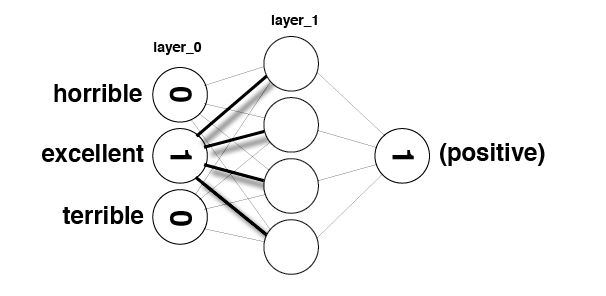

In [86]:
Image(filename='sentiment_network_sparse.png')

In [87]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [88]:
get_most_similar_words("excellent")

[('excellent', 0.14230727203207025),
 ('perfect', 0.12640024015831661),
 ('amazing', 0.095987074706094355),
 ('wonderful', 0.095325700287748588),
 ('today', 0.094595759159488618),
 ('great', 0.094004705923770637),
 ('fun', 0.091883925138029329),
 ('best', 0.089320622848633166),
 ('brilliant', 0.080318355864381921),
 ('loved', 0.078460274035276167),
 ('favorite', 0.078454831698848121),
 ('definitely', 0.078211336879680515),
 ('liked', 0.078035427186750356),
 ('superb', 0.076241140300905369),
 ('fantastic', 0.074023881716704654),
 ('job', 0.07321500048248071),
 ('enjoyable', 0.07222189225903243),
 ('perfectly', 0.070028776663130607),
 ('rare', 0.067059026898819304),
 ('wonderfully', 0.064401602998985064),
 ('fascinating', 0.063976262484281884),
 ('incredible', 0.06361706985728191),
 ('highly', 0.063510104815743929),
 ('enjoyed', 0.062535776372985324),
 ('entertaining', 0.061557017585719513),
 ('gem', 0.059950254013349621),
 ('outstanding', 0.059850578823001328),
 ('masterpiece', 0.059352

In [94]:
get_most_similar_words("terrible")

[('worst', 0.18607921242714026),
 ('awful', 0.13905297335073014),
 ('waste', 0.13086179877065471),
 ('terrible', 0.11001993849722055),
 ('poor', 0.1037559613403196),
 ('dull', 0.092952268496302518),
 ('boring', 0.088854581748802813),
 ('disappointment', 0.088201351104444409),
 ('fails', 0.088096739523235629),
 ('unfortunately', 0.087062920205718194),
 ('poorly', 0.086632344079290186),
 ('disappointing', 0.085713149639009528),
 ('worse', 0.079653686327538942),
 ('mess', 0.079543811743979523),
 ('stupid', 0.079104270611282182),
 ('badly', 0.074625096463424814),
 ('wasted', 0.072799120504519657),
 ('bad', 0.072488546853950897),
 ('annoying', 0.072312402648991858),
 ('save', 0.070165758269812445),
 ('laughable', 0.06870110054616696),
 ('disappointed', 0.067972570251335379),
 ('horrible', 0.067864279151204437),
 ('supposed', 0.066499225217512531),
 ('oh', 0.064025014896531451),
 ('ridiculous', 0.063877252100636911),
 ('nothing', 0.063542121813386712),
 ('crap', 0.06312529500556853),
 ('lame

In [95]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [96]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [97]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [93]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words